## l2hmc

## Imports

In [1]:
%load_ext autoreload
%autoreload 2
%autosave 120
%load_ext rich
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

Autosaving every 120 seconds


In [2]:
import matplotx
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context('notebook')
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 150
sns.set_palette(['#FF5252', '#228BE6', '#40C057', '#E64980', '#14AABF', '#BE4BDB'])
#sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'

In [3]:
import tensorflow as tf

In [4]:
tf.keras.backend.set_floatx('float64')

In [5]:
import torch
torch.set_default_dtype(torch.float64)

In [6]:
import os
import sys
from pathlib import Path

modulepath = Path(os.getcwd()).parent.parent.parent
if modulepath.as_posix() not in sys.path:
    sys.path.append(modulepath.as_posix())

In [7]:
extras = modulepath.joinpath('l2hmc-qcd')
if extras.as_posix() not in sys.path:
    sys.path.append(extras.as_posix())

In [8]:
import torch

import numpy as np
import tensorflow as tf

from src.l2hmc.configs import DynamicsConfig
from src.l2hmc.lattice.pytorch.lattice import Lattice as ptLattice
from src.l2hmc.lattice.tensorflow.lattice import Lattice as tfLattice

from src.l2hmc.network.pytorch.network import NetworkFactory as ptNetworkFactory
from src.l2hmc.network.tensorflow.network import NetworkFactory as tfNetworkFactory

2022-01-20 07:37:17.710896: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Helper functions

In [9]:
def stack_history(history):
    history_ = {}
    for key, val in history.items():
        if not isinstance(val[0], (tf.Tensor, torch.Tensor, np.ndarray, float)):
            print(f'Skipping key: {key}, val.dtype: {type(val)}')
            continue
        elif isinstance(val[0], tf.Tensor):
            history_[key] = tf.stack(val).numpy()
        elif isinstance(val[0], torch.Tensor):
            history_[key] = torch.stack(val).detach().numpy()
        elif isinstance(val[0], (float, np.ndarray)):
            history_[key] = np.stack(val)
            
    return history_

from typing import Optional

FIGSIZE = (9, 4)
def plot_both(
        ytf: np.ndarray,
        ypt: np.ndarray,
        figsize: Optional[tuple[int]] = FIGSIZE,
        xlabel: Optional[str] = None,
        ylabel: Optional[str] = None,
) -> tuple[plt.Figure, plt.Axes]:
    fig, ax = plt.subplots(figsize=figsize)
    _ = ax.plot(np.arange(ytf.shape[0]), ytf, label='Tensorflow');
    _ = ax.plot(np.arange(ypt.shape[0]), ypt, label='Pytorch');
    
    if xlabel is not None:
        _ = ax.set_xlabel(xlabel)
    if ylabel is not None:
        _ = ax.set_ylabel(ylabel)
    
    _ = ax.grid(True, color='#252525');
    matplotx.line_labels(ax=ax)
    return fig, ax

def stack_directional_history_tf(history):
    hist = {}
    for key in history[0].keys():
        hist[key] = tf.stack([x.get(key) for x in history]).numpy()
        
    return hist

def stack_directional_history_pt(history):
    hist = {}
    for key in history[0].keys():
        hist[key] = torch.stack([x.get(key) for x in history]).detach().numpy()
        
    return hist

def stack(x):
    try:
        if isinstance(x, list):
            if isinstance(x[0], tf.Tensor):
                return tf.stack(x).numpy()
            if isinstance(x[0], torch.Tensor):
                try:
                    return torch.stack(x).detach().numpy()
                except:
                    return torch.Tensor(x).detach().numpy()
            return np.stack(x)
        return np.stack(x)
    except:
        return np.zeros_like(x)
        

def dict_summary(d):
    strs = []
    for key, val in d.items():
        if isinstance(val, dict):
            strs.append(f'{key}={dict_summary(val)}')
        else:
            try:
                strs.append(f'{key}={np.mean(val):.3g}')
            except:
                strs.append(f'{key}={val.mean():.3g}')
            
    return strs

## Define configurations

Note: We use a shared set of configuration objects for both the `pytorch` and `tensorflow` implementations

In [10]:
from src.l2hmc.configs import (
    Steps,
    InputSpec,
    LossConfig,
    NetworkConfig,
    NetWeight,
    NetWeights,
)

beta = 1.
nleapfrog = 5 
eps_init = 0.005
xshape = (64, 8, 8, 2)


steps = {
    'log': 5,
    'nera': 5,
    'print': 50,
    'nepoch': 100,
    'test': 0,
}
steps = Steps(**steps)

# scaling factors multiplying the   (s , t ,  q) network functions
net_weights = NetWeights(x=NetWeight(1., 1., 1.),
                         v=NetWeight(1., 1., 1.))

net_config = NetworkConfig(units=[8, 8, 8, 8],  # sizes of hidden layers
                           dropout_prob=0.,  # dropout probability
                           activation_fn='relu',  # activation fn
                           use_batch_norm=False)  # use batch_norm

dynamics_config = DynamicsConfig(xshape=xshape,
                                 eps=eps_init,
                                 nleapfrog=nleapfrog,
                                 eps_fixed=False,
                                 use_ncp=True,
                                 use_split_xnets=True,
                                 verbose=True,
                                 use_separate_networks=True)

xdim = dynamics_config.xdim
input_spec = InputSpec(xshape=xshape,
                       # note: we stack the input to the xNetwork
                       # as [cos(x), sin(x)], hence (xdim, 2) below
                       xnet={'x': (xdim, 2), 'v': (xdim,)},
                       vnet={'x': (xdim,), 'v': (xdim,)})

loss_config = LossConfig(use_mixed_loss=True,
                         plaq_weight=0.,
                         charge_weight=0.01)

## Build `tensorflow` Dynamics object

In [18]:
from src.l2hmc.lattice.tensorflow.lattice import Lattice as tfLattice
from src.l2hmc.dynamics.tensorflow.dynamics import Dynamics as tfDynamics
from src.l2hmc.network.tensorflow.network import NetworkFactory as tfNetworkFactory
from src.l2hmc.loss.tensorflow.loss import LatticeLoss as tfLatticeLoss

tf_lattice = tfLattice(xshape)
potential_fn_tf = tf_lattice.action

tf_net_factory = tfNetworkFactory(input_spec=input_spec,
                                  net_weights=net_weights,
                                  network_config=net_config)

dynamics_tf = tfDynamics(potential_fn=potential_fn_tf,
                         config=dynamics_config,
                         network_factory=tf_net_factory)

loss_tf = tfLatticeLoss(lattice=tf_lattice, loss_config=loss_config)

## Build `pytorch` Dynamics object

In [12]:
from src.l2hmc.lattice.pytorch.lattice import Lattice as ptLattice
from src.l2hmc.dynamics.pytorch.dynamics import Dynamics as ptDynamics
from src.l2hmc.network.pytorch.network import NetworkFactory as ptNetworkFactory
from src.l2hmc.loss.pytorch.loss import LatticeLoss as ptLatticeLoss

optim = torch.optim

pt_lattice = ptLattice(xshape)
potential_fn_pt = pt_lattice.action

pt_net_factory = ptNetworkFactory(input_spec=input_spec,
                                  net_weights=net_weights,
                                  network_config=net_config)

dynamics_pt = ptDynamics(potential_fn=potential_fn_pt,
                         config=dynamics_config,
                         network_factory=pt_net_factory)


loss_pt = ptLatticeLoss(lattice=pt_lattice,
                        loss_config=loss_config)

optimizer_pt = optim.Adam(dynamics_pt.parameters())
loss_pt = ptLatticeLoss(lattice=pt_lattice, loss_config=loss_config)

## Test lattice methods

In [13]:
xinit_tf = tf.random.uniform(xshape, *(-np.pi, np.pi))
xinit_np = xinit_tf.numpy()
xinit_pt = torch.tensor(xinit_np, requires_grad=True)

wl_init_tf = tf_lattice.wilson_loops(x=xinit_tf)
wl_init_pt = pt_lattice.wilson_loops(x=xinit_pt)

dxinit = xinit_tf.numpy() - xinit_pt.detach().numpy()
dwl_init = wl_init_tf.numpy() - wl_init_pt.detach().numpy()
dwl_init.sum()
dwl_init.mean()
dxinit.sum()

0.0

0.0

0.0

# Training

## Try training `pytorch` Dynamics

In [14]:
import time
from rich import print
from torch import optim
from src.l2hmc.trainers.pytorch.trainer import train_step as train_step_pt
from src.l2hmc.dynamics.pytorch.dynamics import random_angle
from rich.console import Console

dynamics_pt.train()
optimizer_pt = optim.Adam(dynamics_pt.parameters())
xpt = random_angle(xinit_pt.shape)
xpt = xpt.reshape(xpt.shape[0], -1)

console = Console(color_system='truecolor', log_path=False)

Dynamics(
  (networks): ModuleDict(
    (xnet): ModuleDict(
      (0): ModuleDict(
        (first): Network(
          (x_layer): Linear(in_features=256, out_features=8, bias=True)
          (v_layer): Linear(in_features=128, out_features=8, bias=True)
          (hidden_layers): ModuleList(
            (0): Linear(in_features=8, out_features=8, bias=True)
            (1): Linear(in_features=8, out_features=8, bias=True)
            (2): Linear(in_features=8, out_features=8, bias=True)
          )
          (scale): Linear(in_features=8, out_features=128, bias=True)
          (transl): Linear(in_features=8, out_features=128, bias=True)
          (transf): Linear(in_features=8, out_features=128, bias=True)
        )
        (second): Network(
          (x_layer): Linear(in_features=256, out_features=8, bias=True)
          (v_layer): Linear(in_features=128, out_features=8, bias=True)
          (hidden_layers): ModuleList(
            (0): Linear(in_features=8, out_features=8, bias=True)
            (1): Linear(in_features=8, out_features=8, bias=True)
            (2): Linear(in_features=8, out_features=8, bias=True)
          )
          (scale): Linear(in_features=8, out_features=128, bias=True)
          (transl): Linear(in_features=8, out_features=128, bias=True)
          (transf): Linear(in_features=8, out_features=128, bias=True)
        )
      )
      (1): ModuleDict(
        (first): Network(
          (x_layer): Linear(in_features=256, out_features=8, bias=True)
          (v_layer): Linear(in_features=128, out_features=8, bias=True)
          (hidden_layers): ModuleList(
            (0): Linear(in_features=8, out_features=8, bias=True)
            (1): Linear(in_features=8, out_features=8, bias=True)
            (2): Linear(in_features=8, out_features=8, bias=True)
          )
          (scale): Linear(in_features=8, out_features=128, bias=True)
          (transl): Linear(in_features=8, out_features=128, bias=True)
          (transf): Linear(in_features=8, out_features=128, bias=True)
        )
        (second): Network(
          (x_layer): Linear(in_features=256, out_features=8, bias=True)
          (v_layer): Linear(in_features=128, out_features=8, bias=True)
          (hidden_layers): ModuleList(
            (0): Linear(in_features=8, out_features=8, bias=True)
            (1): Linear(in_features=8, out_features=8, bias=True)
            (2): Linear(in_features=8, out_features=8, bias=True)
          )
          (scale): Linear(in_features=8, out_features=128, bias=True)
          (transl): Linear(in_features=8, out_features=128, bias=True)
          (transf): Linear(in_features=8, out_features=128, bias=True)
        )
      )
      (2): ModuleDict(
        (first): Network(
          (x_layer): Linear(in_features=256, out_features=8, bias=True)
          (v_layer): Linear(in_features=128, out_features=8, bias=True)
          (hidden_layers): ModuleList(
            (0): Linear(in_features=8, out_features=8, bias=True)
            (1): Linear(in_features=8, out_features=8, bias=True)
            (2): Linear(in_features=8, out_features=8, bias=True)
          )
          (scale): Linear(in_features=8, out_features=128, bias=True)
          (transl): Linear(in_features=8, out_features=128, bias=True)
          (transf): Linear(in_features=8, out_features=128, bias=True)
        )
        (second): Network(
          (x_layer): Linear(in_features=256, out_features=8, bias=True)
          (v_layer): Linear(in_features=128, out_features=8, bias=True)
          (hidden_layers): ModuleList(
            (0): Linear(in_features=8, out_features=8, bias=True)
            (1): Linear(in_features=8, out_features=8, bias=True)
            (2): Linear(in_features=8, out_features=8, bias=True)
          )
          (scale): Linear(in_features=8, out_features=128, bias=True)
          (transl): Linear(in_features=8, out_features=128, bias=True)
          (transf): Linear(in_features=8, out_features=128, bias=True)
        )
      

In [15]:
xpt.dtype

torch.float64

In [16]:
from src.l2hmc.trainers.pytorch.trainer import Trainer as ptTrainer

trainer_pt = ptTrainer(steps=steps,
                       dynamics=dynamics_pt,
                       optimizer=optimizer_pt,
                       loss_fn=loss_pt)

output_pt = trainer_pt.train()

────────────────────────────────────────── ERA: 0 ───────────────────────────────────────────

[07:38:01] era=0.00, epoch=0.00, dt=0.20, loss=24.78, acc=0.98, acc_mask=0.98, logdet=0.00,  
           forward/xeps=0.01, forward/veps=0.01, forward/energy=127.27, forward/logdet=-0.01,
           forward/logprob=127.28, forward/acc=0.98, forward/sumlogdet=-0.02,                
           backward/xeps=0.01, backward/veps=0.01, backward/energy=129.63,                   
           backward/logdet=0.01, backward/logprob=129.62, backward/acc=0.97,                 
           backward/sumlogdet=0.03

[07:38:11] era=0.00, epoch=50.00, dt=0.23, loss=-0.58, acc=0.90, acc_mask=0.88, logdet=0.10, 
           forward/xeps=0.03, forward/veps=0.02, forward/energy=110.12, forward/logdet=-0.14,
           forward/logprob=110.26, forward/acc=0.94, forward/sumlogdet=-0.28,                
           backward/xeps=0.03, backward/veps=0.02, backward/energy=110.43,                   
           backward/logdet=0.27, backward/logprob=110.16, backward/acc=0.89,                 
           backward/sumlogdet=0.54

─────────────────────────────────────────────────────────────────────────────────────────────

[07:38:21] Era 0 took: 20 s                                                                  
           Avgs over last era:                                                               
            dt=0.2                                                                           
           loss=0.4                                                                          
           acc=0.91                                                                          
           acc_mask=0.91                                                                     
           logdet=0.13                                                                       
           forward/xeps=0.03                                                                 
           forward/veps=0.023                                                                
           forward/energy=1.1e+02                                                            
           forward/logdet=-0.17                                                              
           forward/logprob=1.1e+02                                                           
           forward/acc=0.95                                                                  
           forward/sumlogdet=-0.34                                                           
           backward/xeps=0.03                                                                
           backward/veps=0.023                                                               
           backward/energy=1.1e+02                                                           
           backward/logdet=0.34                                                              
           backward/logprob=1.1e+02                                                          
           backward/acc=0.87                                                                 
           backward/sumlogdet=0.65

─────────────────────────────────────────────────────────────────────────────────────────────

────────────────────────────────────────── ERA: 1 ───────────────────────────────────────────

           era=1.00, epoch=0.00, dt=0.21, loss=-4.07, acc=0.82, acc_mask=0.78, logdet=0.14,  
           forward/xeps=0.05, forward/veps=0.04, forward/energy=99.14, forward/logdet=-0.45, 
           forward/logprob=99.59, forward/acc=0.93, forward/sumlogdet=-0.94,                 
           backward/xeps=0.05, backward/veps=0.04, backward/energy=101.22,                   
           backward/logdet=0.92, backward/logprob=100.30, backward/acc=0.78,                 
           backward/sumlogdet=1.75

[07:38:34] era=1.00, epoch=50.00, dt=0.29, loss=-29.13, acc=0.83, acc_mask=0.83, logdet=0.45,
           forward/xeps=0.08, forward/veps=0.06, forward/energy=97.15, forward/logdet=-0.89, 
           forward/logprob=98.04, forward/acc=0.96, forward/sumlogdet=-1.85,                 
           backward/xeps=0.08, backward/veps=0.06, backward/energy=100.48,                   
           backward/logdet=1.77, backward/logprob=98.71, backward/acc=0.67,                  
           backward/sumlogdet=3.38

─────────────────────────────────────────────────────────────────────────────────────────────

[07:38:48] Era 1 took: 26 s                                                                  
           Avgs over last era:                                                               
            dt=0.26                                                                          
           loss=-21                                                                          
           acc=0.82                                                                          
           acc_mask=0.83                                                                     
           logdet=0.16                                                                       
           forward/xeps=0.075                                                                
           forward/veps=0.061                                                                
           forward/energy=99                                                                 
           forward/logdet=-0.86                                                              
           forward/logprob=1e+02                                                             
           forward/acc=0.94                                                                  
           forward/sumlogdet=-1.8                                                            
           backward/xeps=0.075                                                               
           backward/veps=0.061                                                               
           backward/energy=1e+02                                                             
           backward/logdet=1.7                                                               
           backward/logprob=1e+02                                                            
           backward/acc=0.7                                                                  
           backward/sumlogdet=3.2

─────────────────────────────────────────────────────────────────────────────────────────────

────────────────────────────────────────── ERA: 2 ───────────────────────────────────────────

           era=2.00, epoch=0.00, dt=0.38, loss=-38.76, acc=0.81, acc_mask=0.83, logdet=0.10, 
           forward/xeps=0.10, forward/veps=0.08, forward/energy=98.19, forward/logdet=-1.24, 
           forward/logprob=99.43, forward/acc=0.94, forward/sumlogdet=-2.60,                 
           backward/xeps=0.10, backward/veps=0.08, backward/energy=104.58,                   
           backward/logdet=2.49, backward/logprob=102.09, backward/acc=0.61,                 
           backward/sumlogdet=4.76

[07:39:05] era=2.00, epoch=50.00, dt=0.40, loss=-43.75, acc=0.73, acc_mask=0.72, logdet=0.05,
           forward/xeps=0.13, forward/veps=0.08, forward/energy=101.17, forward/logdet=-1.39,
           forward/logprob=102.56, forward/acc=0.92, forward/sumlogdet=-2.91,                
           backward/xeps=0.13, backward/veps=0.08, backward/energy=106.15,                   
           backward/logdet=2.74, backward/logprob=103.41, backward/acc=0.58,                 
           backward/sumlogdet=5.21

─────────────────────────────────────────────────────────────────────────────────────────────

[07:39:27] Era 2 took: 39 s                                                                  
           Avgs over last era:                                                               
            dt=0.38                                                                          
           loss=-45                                                                          
           acc=0.79                                                                          
           acc_mask=0.79                                                                     
           logdet=0.16                                                                       
           forward/xeps=0.12                                                                 
           forward/veps=0.084                                                                
           forward/energy=99                                                                 
           forward/logdet=-1.4                                                               
           forward/logprob=1e+02                                                             
           forward/acc=0.96                                                                  
           forward/sumlogdet=-3                                                              
           backward/xeps=0.12                                                                
           backward/veps=0.084                                                               
           backward/energy=1e+02                                                             
           backward/logdet=2.8                                                               
           backward/logprob=1e+02                                                            
           backward/acc=0.61                                                                 
           backward/sumlogdet=5.4

─────────────────────────────────────────────────────────────────────────────────────────────

────────────────────────────────────────── ERA: 3 ───────────────────────────────────────────

           era=3.00, epoch=0.00, dt=0.55, loss=-40.58, acc=0.66, acc_mask=0.66, logdet=-0.37,
           forward/xeps=0.15, forward/veps=0.09, forward/energy=100.03, forward/logdet=-1.51,
           forward/logprob=101.53, forward/acc=0.99, forward/sumlogdet=-3.16,                
           backward/xeps=0.15, backward/veps=0.09, backward/energy=108.39,                   
           backward/logdet=3.06, backward/logprob=105.33, backward/acc=0.44,                 
           backward/sumlogdet=5.80

[07:39:52] era=3.00, epoch=50.00, dt=0.56, loss=-58.43, acc=0.84, acc_mask=0.88,             
           logdet=-0.26, forward/xeps=0.17, forward/veps=0.09, forward/energy=101.48,        
           forward/logdet=-1.57, forward/logprob=103.06, forward/acc=0.97,                   
           forward/sumlogdet=-3.38, backward/xeps=0.17, backward/veps=0.09,                  
           backward/energy=105.42, backward/logdet=3.33, backward/logprob=102.09,            
           backward/acc=0.55, backward/sumlogdet=6.20

─────────────────────────────────────────────────────────────────────────────────────────────

[07:40:24] Era 3 took: 58 s                                                                  
           Avgs over last era:                                                               
            dt=0.57                                                                          
           loss=-65                                                                          
           acc=0.74                                                                          
           acc_mask=0.74                                                                     
           logdet=0.11                                                                       
           forward/xeps=0.17                                                                 
           forward/veps=0.093                                                                
           forward/energy=99                                                                 
           forward/logdet=-1.6                                                               
           forward/logprob=1e+02                                                             
           forward/acc=0.96                                                                  
           forward/sumlogdet=-3.4                                                            
           backward/xeps=0.17                                                                
           backward/veps=0.093                                                               
           backward/energy=1.1e+02                                                           
           backward/logdet=3.3                                                               
           backward/logprob=1e+02                                                            
           backward/acc=0.53                                                                 
           backward/sumlogdet=6.2

─────────────────────────────────────────────────────────────────────────────────────────────

────────────────────────────────────────── ERA: 4 ───────────────────────────────────────────

[07:40:25] era=4.00, epoch=0.00, dt=1.00, loss=-81.29, acc=0.69, acc_mask=0.75, logdet=1.08, 
           forward/xeps=0.19, forward/veps=0.10, forward/energy=101.60, forward/logdet=-1.70,
           forward/logprob=103.30, forward/acc=0.98, forward/sumlogdet=-3.69,                
           backward/xeps=0.19, backward/veps=0.10, backward/energy=104.46,                   
           backward/logdet=3.55, backward/logprob=100.91, backward/acc=0.49,                 
           backward/sumlogdet=6.56

[07:41:14] era=4.00, epoch=50.00, dt=1.08, loss=-49.59, acc=0.80, acc_mask=0.75, logdet=0.55,
           forward/xeps=0.20, forward/veps=0.12, forward/energy=97.45, forward/logdet=-1.67, 
           forward/logprob=99.11, forward/acc=0.97, forward/sumlogdet=-3.70,                 
           backward/xeps=0.20, backward/veps=0.12, backward/energy=103.72,                   
           backward/logdet=3.75, backward/logprob=99.96, backward/acc=0.56,                  
           backward/sumlogdet=6.85

─────────────────────────────────────────────────────────────────────────────────────────────

[07:42:14] Era 4 took: 1.1e+02s                                                              
           Avgs over last era:                                                               
            dt=1                                                                             
           loss=-73                                                                          
           acc=0.74                                                                          
           acc_mask=0.74                                                                     
           logdet=0.23                                                                       
           forward/xeps=0.19                                                                 
           forward/veps=0.12                                                                 
           forward/energy=99                                                                 
           forward/logdet=-1.6                                                               
           forward/logprob=1e+02                                                             
           forward/acc=0.97                                                                  
           forward/sumlogdet=-3.5                                                            
           backward/xeps=0.19                                                                
           backward/veps=0.12                                                                
           backward/energy=1e+02                                                             
           backward/logdet=3.5                                                               
           backward/logprob=1e+02                                                            
           backward/acc=0.5                                                                  
           backward/sumlogdet=6.5

─────────────────────────────────────────────────────────────────────────────────────────────

## Try training `TensorFlow` Dynamics:

In [19]:
from src.l2hmc.trainers.tensorflow.trainer import Trainer as tfTrainer

optimizer_tf = tf.keras.optimizers.Adam()

trainer_tf = tfTrainer(steps=steps,
                       dynamics=dynamics_tf,
                       optimizer=optimizer_tf,
                       loss_fn=loss_tf)

output_tf = trainer_tf.train()

────────────────────────────────────────── ERA: 0 ───────────────────────────────────────────

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '_fields'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '_fields'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


[07:48:39] era=0.00, epoch=0.00, dt=62.04, loss=20.22, acc=0.98, acc_mask=0.97, logdet=-0.01,
           forward/sumlogdet=-0.01, backward/sumlogdet=-0.01

[07:48:49] era=0.00, epoch=50.00, dt=0.21, loss=0.36, acc=0.87, acc_mask=0.88, logdet=0.09,  
           forward/sumlogdet=0.09, backward/sumlogdet=0.10

─────────────────────────────────────────────────────────────────────────────────────────────

[07:49:00] Era 0 took: 1.3e+02s                                                              
           Avgs over last era:                                                               
            dt=3.3                                                                           
           loss=0.81                                                                         
           acc=0.88                                                                          
           acc_mask=0.88                                                                     
           logdet=0.074                                                                      
           forward/sumlogdet=0.085                                                           
           backward/sumlogdet=0.083

─────────────────────────────────────────────────────────────────────────────────────────────

────────────────────────────────────────── ERA: 1 ───────────────────────────────────────────

           era=1.00, epoch=0.00, dt=0.27, loss=-7.32, acc=0.81, acc_mask=0.78, logdet=0.13,  
           forward/sumlogdet=0.18, backward/sumlogdet=0.18

[07:49:13] era=1.00, epoch=50.00, dt=0.29, loss=-15.27, acc=0.82, acc_mask=0.89, logdet=0.14,
           forward/sumlogdet=0.18, backward/sumlogdet=0.19

─────────────────────────────────────────────────────────────────────────────────────────────

[07:49:29] Era 1 took: 29 s                                                                  
           Avgs over last era:                                                               
            dt=0.29                                                                          
           loss=-18                                                                          
           acc=0.79                                                                          
           acc_mask=0.8                                                                      
           logdet=0.19                                                                       
           forward/sumlogdet=0.24                                                            
           backward/sumlogdet=0.23

─────────────────────────────────────────────────────────────────────────────────────────────

────────────────────────────────────────── ERA: 2 ───────────────────────────────────────────

[07:49:30] era=2.00, epoch=0.00, dt=0.33, loss=-38.23, acc=0.80, acc_mask=0.80, logdet=0.22, 
           forward/sumlogdet=0.30, backward/sumlogdet=0.27

[07:49:49] era=2.00, epoch=50.00, dt=0.38, loss=-41.91, acc=0.86, acc_mask=0.83, logdet=0.20,
           forward/sumlogdet=0.25, backward/sumlogdet=0.22

─────────────────────────────────────────────────────────────────────────────────────────────

[07:50:10] Era 2 took: 41 s                                                                  
           Avgs over last era:                                                               
            dt=0.4                                                                           
           loss=-46                                                                          
           acc=0.83                                                                          
           acc_mask=0.84                                                                     
           logdet=0.21                                                                       
           forward/sumlogdet=0.23                                                            
           backward/sumlogdet=0.24

─────────────────────────────────────────────────────────────────────────────────────────────

────────────────────────────────────────── ERA: 3 ───────────────────────────────────────────

[07:50:11] era=3.00, epoch=0.00, dt=0.45, loss=-56.87, acc=0.87, acc_mask=0.91, logdet=0.14, 
           forward/sumlogdet=0.13, backward/sumlogdet=0.16

[07:50:34] era=3.00, epoch=50.00, dt=0.49, loss=-73.05, acc=0.83, acc_mask=0.91, logdet=0.10,
           forward/sumlogdet=0.13, backward/sumlogdet=0.12

─────────────────────────────────────────────────────────────────────────────────────────────

[07:50:56] Era 3 took: 46 s                                                                  
           Avgs over last era:                                                               
            dt=0.47                                                                          
           loss=-64                                                                          
           acc=0.84                                                                          
           acc_mask=0.85                                                                     
           logdet=0.13                                                                       
           forward/sumlogdet=0.15                                                            
           backward/sumlogdet=0.16

─────────────────────────────────────────────────────────────────────────────────────────────

────────────────────────────────────────── ERA: 4 ───────────────────────────────────────────

[07:50:57] era=4.00, epoch=0.00, dt=0.43, loss=-70.25, acc=0.85, acc_mask=0.84, logdet=0.16, 
           forward/sumlogdet=0.18, backward/sumlogdet=0.17

[07:51:19] era=4.00, epoch=50.00, dt=0.42, loss=-90.53, acc=0.87, acc_mask=0.88, logdet=0.12,
           forward/sumlogdet=0.12, backward/sumlogdet=0.14

─────────────────────────────────────────────────────────────────────────────────────────────

[07:51:38] Era 4 took: 42 s                                                                  
           Avgs over last era:                                                               
            dt=0.41                                                                          
           loss=-75                                                                          
           acc=0.85                                                                          
           acc_mask=0.87                                                                     
           logdet=0.1                                                                        
           forward/sumlogdet=0.12                                                            
           backward/sumlogdet=0.12

─────────────────────────────────────────────────────────────────────────────────────────────

## Compare

Explicitly, compare the training loss between `pytorch` and `tensorflow`

<Figure size 1575x700 with 1 Axes>

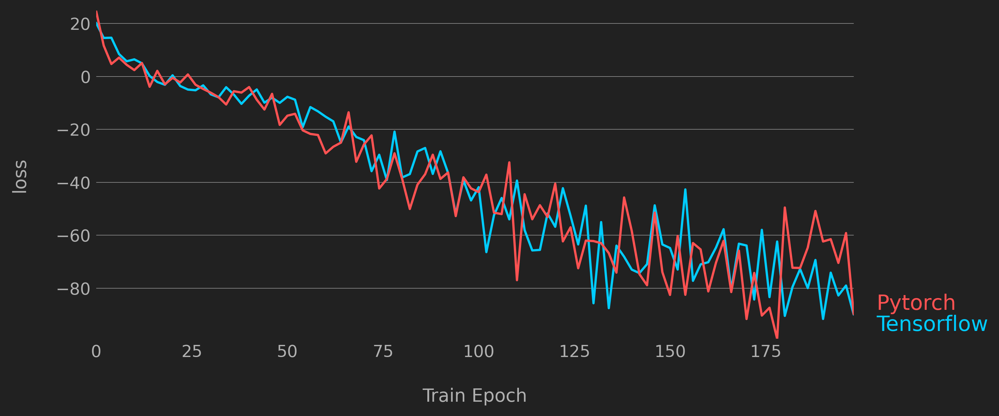

In [ ]:
import matplotx
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context('notebook')
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 175
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'
plt.rcParams['figure.facecolor'] = '#212121'
plt.rcParams['axes.facecolor'] = '#212121'

losses_arr_pt = np.array(output_pt['history'].history['loss'])
losses_arr_tf = np.array(output_tf['history'].history['loss'])
# losses_arr_tf = np.stack(list(losses_tf.values())).flatten()
x_pt = (steps.nepoch * steps.nera // (steps.log * steps.print)) * np.arange(len(losses_arr_pt))
x_tf = (steps.nepoch * steps.nera // (steps.log * steps.print)) * np.arange(len(losses_arr_tf))

with plt.style.context(matplotx.styles.dufte):
    fig, ax = plt.subplots(figsize=(9, 4))
    _ = ax.plot(x_tf, losses_arr_tf, label='Tensorflow');
    _ = ax.plot(x_pt, losses_arr_pt, label='Pytorch');
    _ = ax.set_xlabel(r'Train Epoch');
    _ = ax.set_ylabel('loss');
    _ = matplotx.line_labels();  # line labels to the right

In [22]:
history_tf = output_tf['history']
history_pt = output_pt['history']

dataset_tf = history_tf.get_dataset()
dataset_pt = history_pt.get_dataset()

## Compare training metrics between `TensorFlow` and `PyTorch` implementations 

ERROR! Session/line number was not unique in database. History logging moved to new session 4892


<Figure size 1125x500 with 1 Axes>

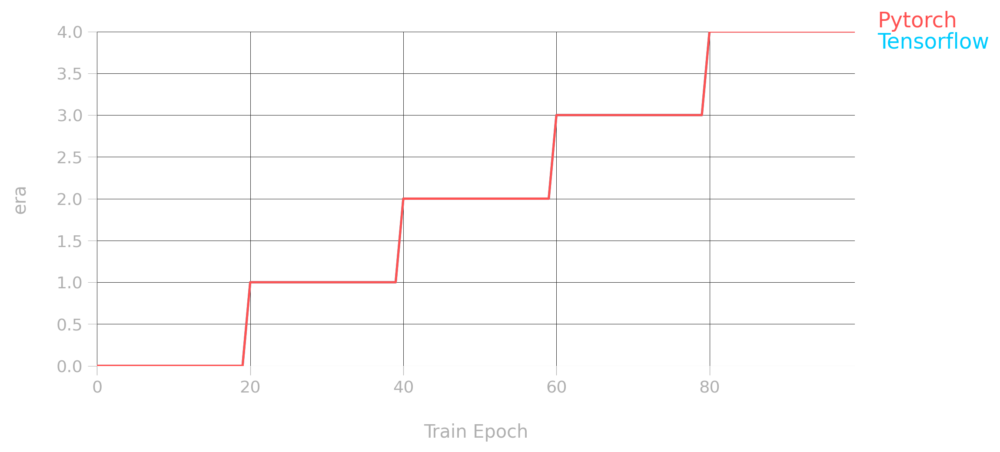

<Figure size 1125x500 with 1 Axes>

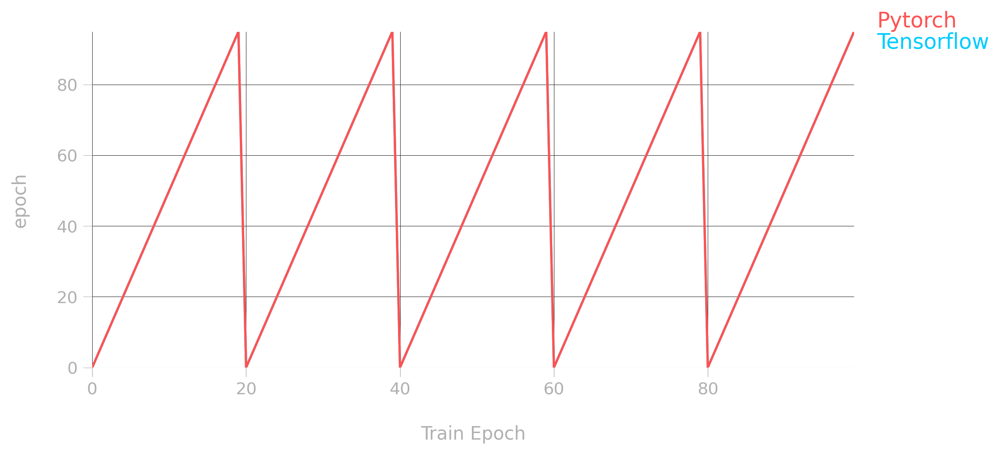

<Figure size 1125x500 with 1 Axes>

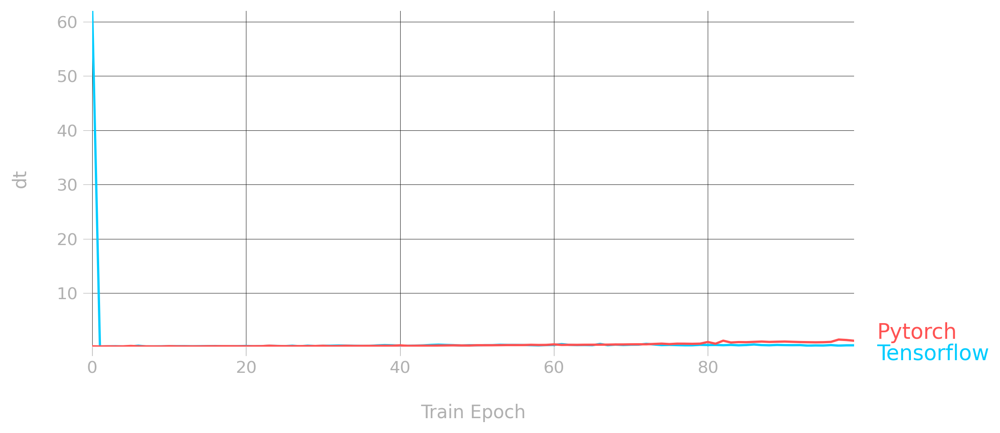

<Figure size 1125x500 with 1 Axes>

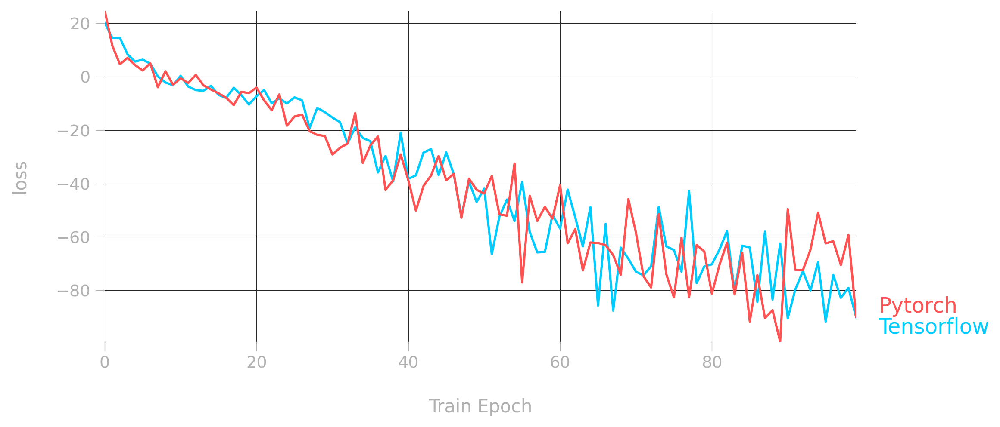

<Figure size 1125x500 with 1 Axes>

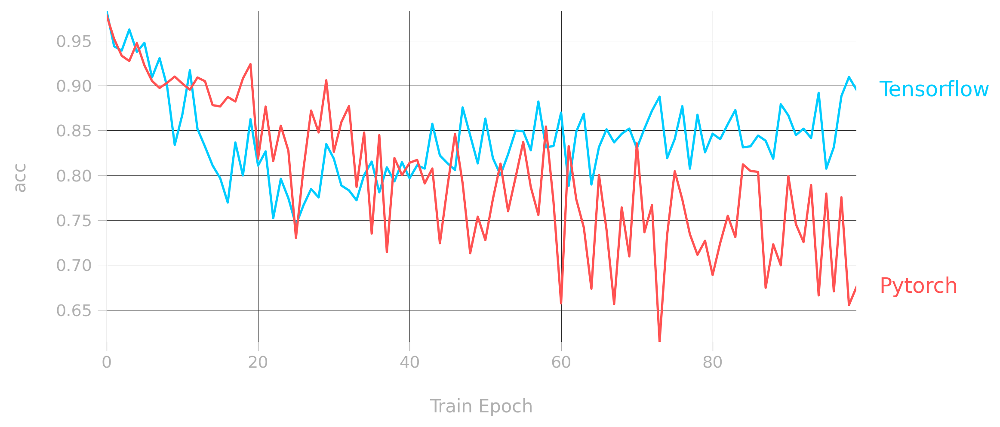

<Figure size 1125x500 with 1 Axes>

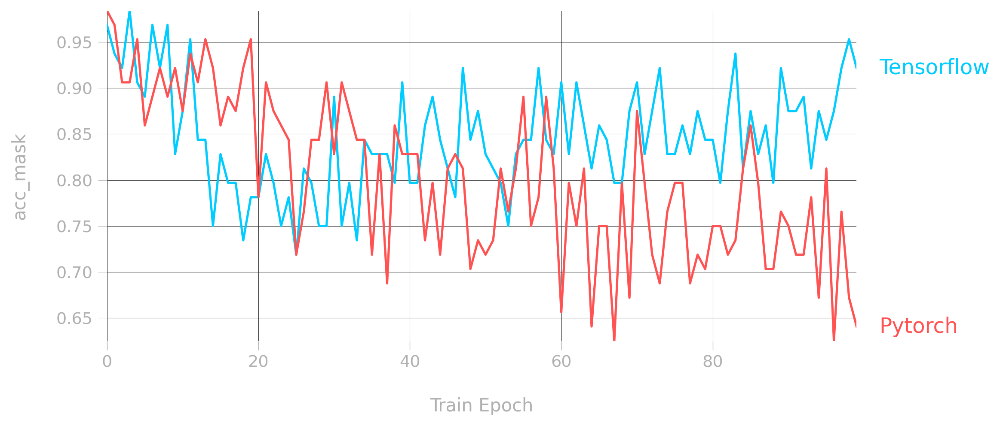

<Figure size 1125x500 with 1 Axes>

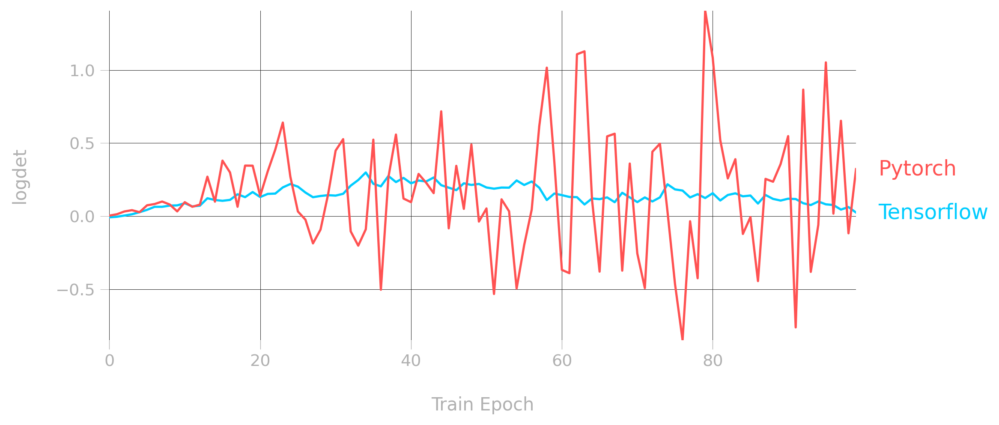

<Figure size 1125x500 with 1 Axes>

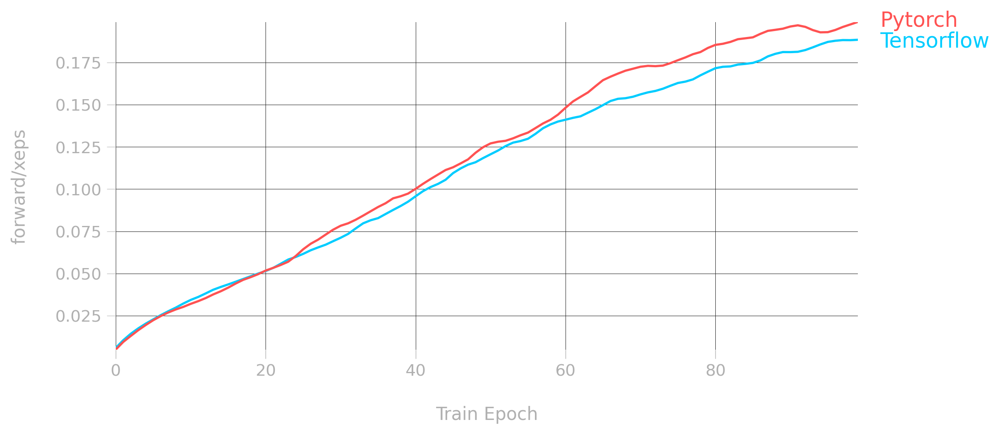

<Figure size 1125x500 with 1 Axes>

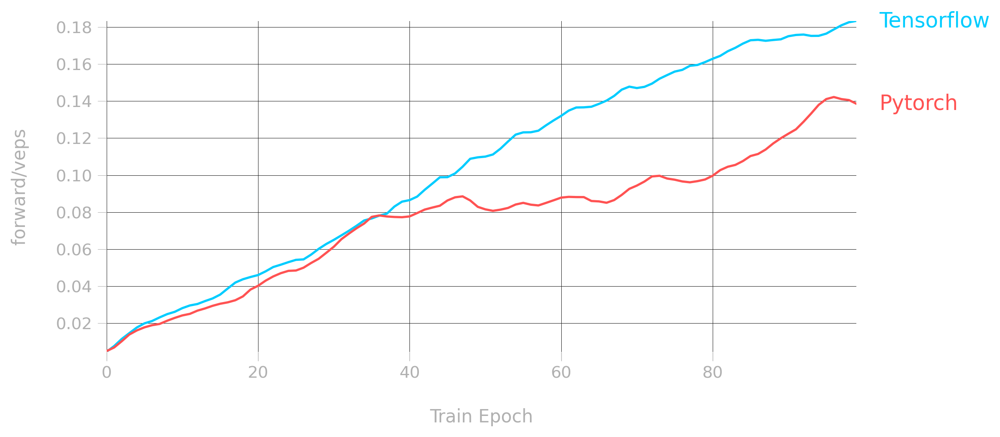

<Figure size 1125x500 with 1 Axes>

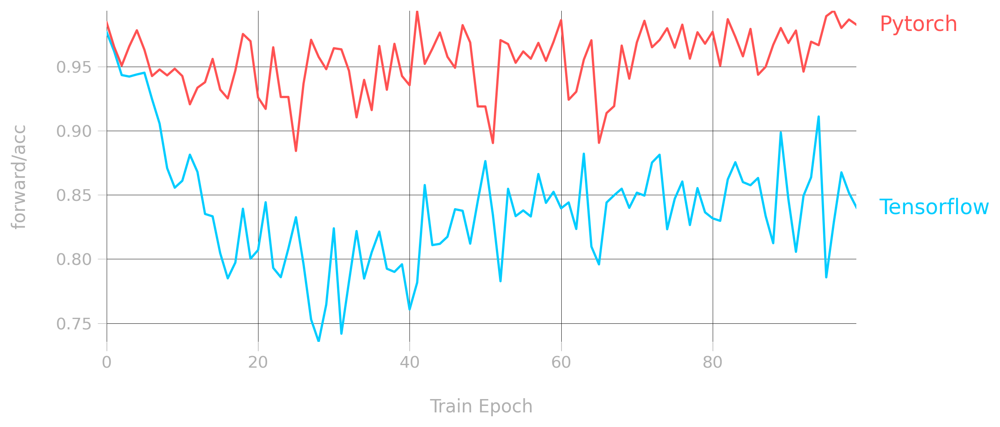

<Figure size 1125x500 with 1 Axes>

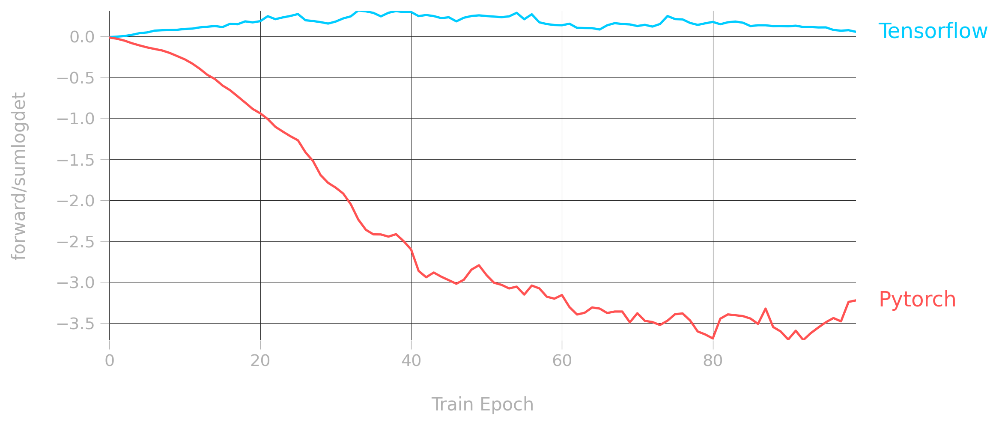

<Figure size 1125x500 with 1 Axes>

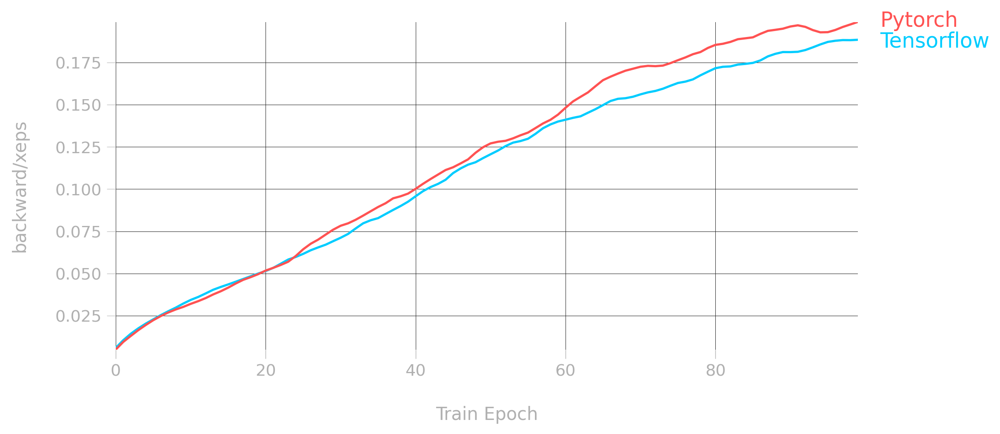

<Figure size 1125x500 with 1 Axes>

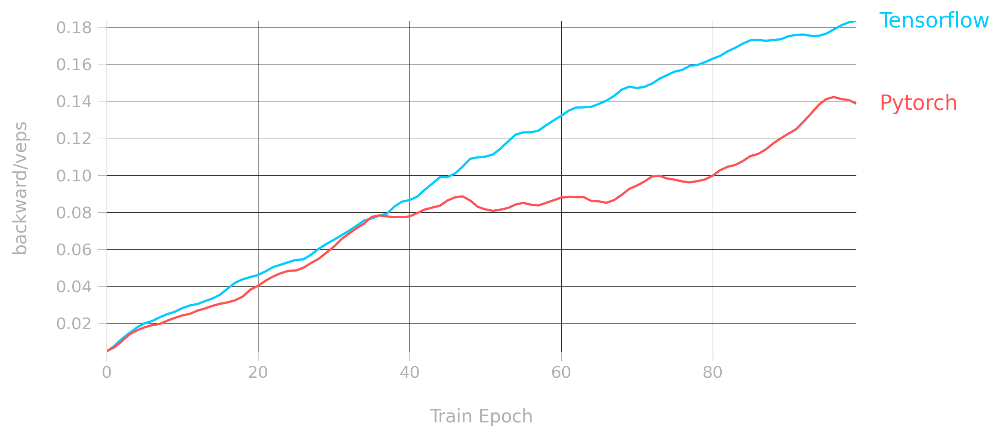

<Figure size 1125x500 with 1 Axes>

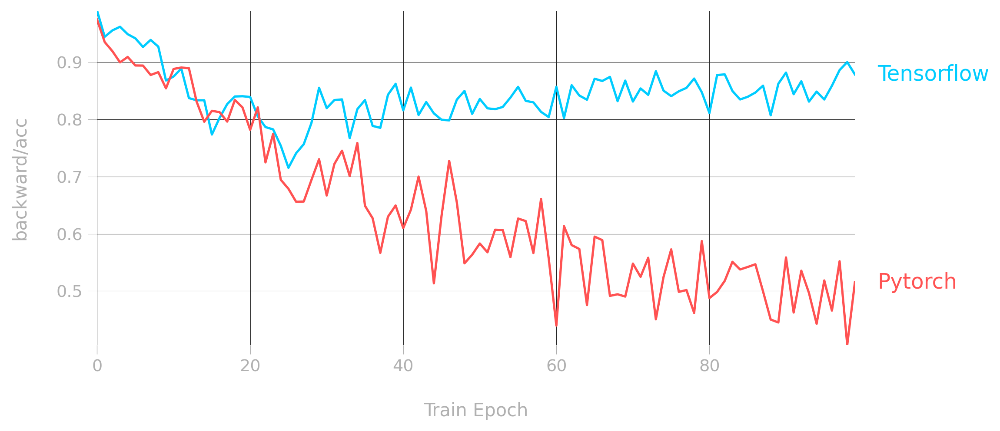

<Figure size 1125x500 with 1 Axes>

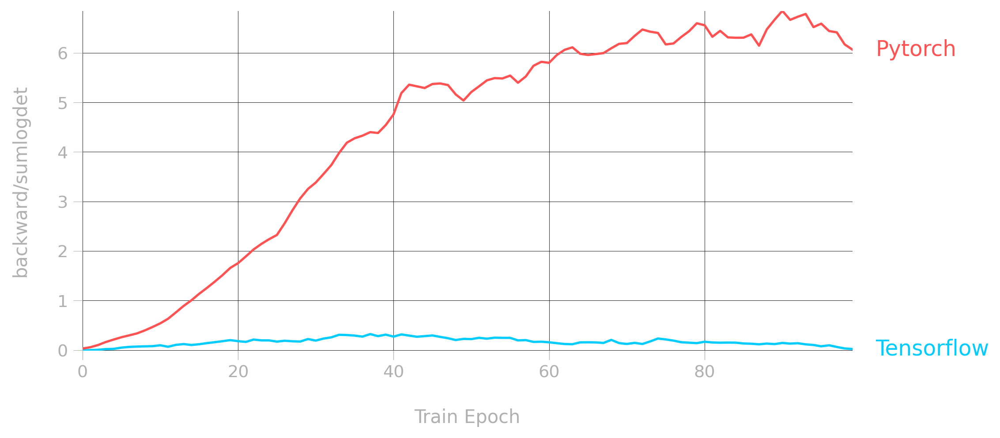

<Figure size 1125x500 with 1 Axes>

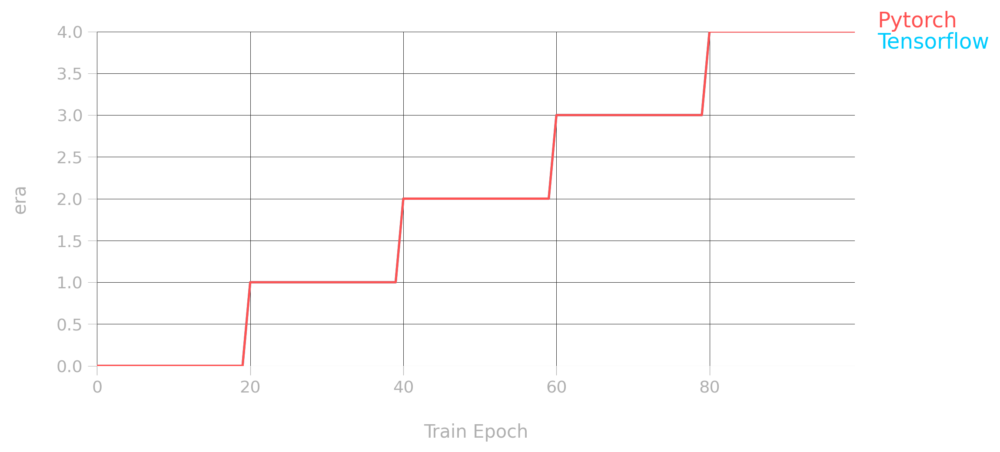

<Figure size 1125x500 with 1 Axes>

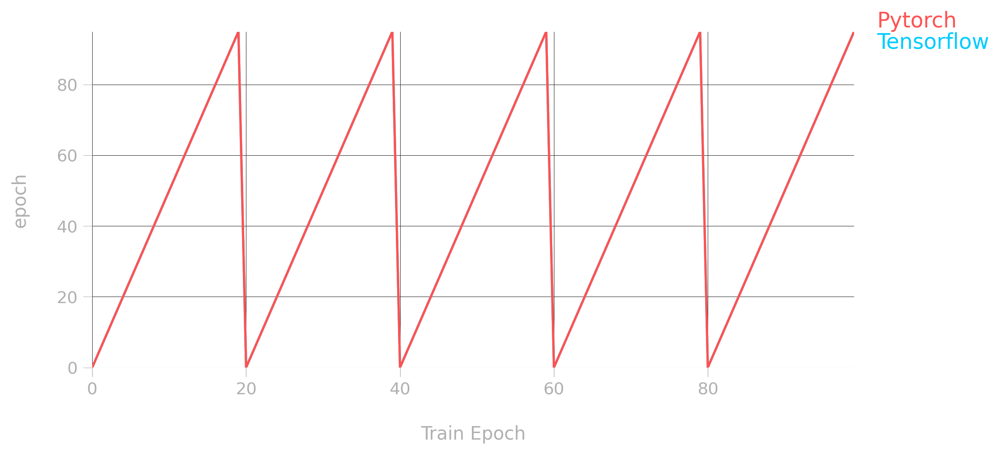

<Figure size 1125x500 with 1 Axes>

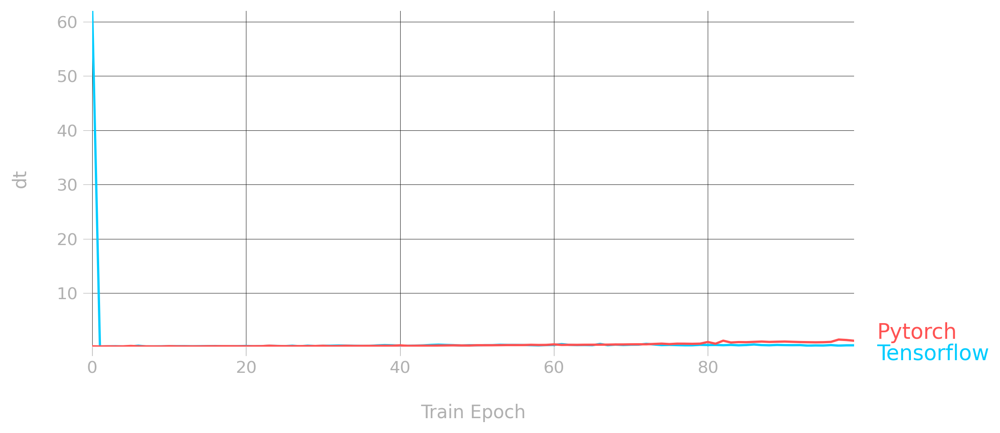

<Figure size 1125x500 with 1 Axes>

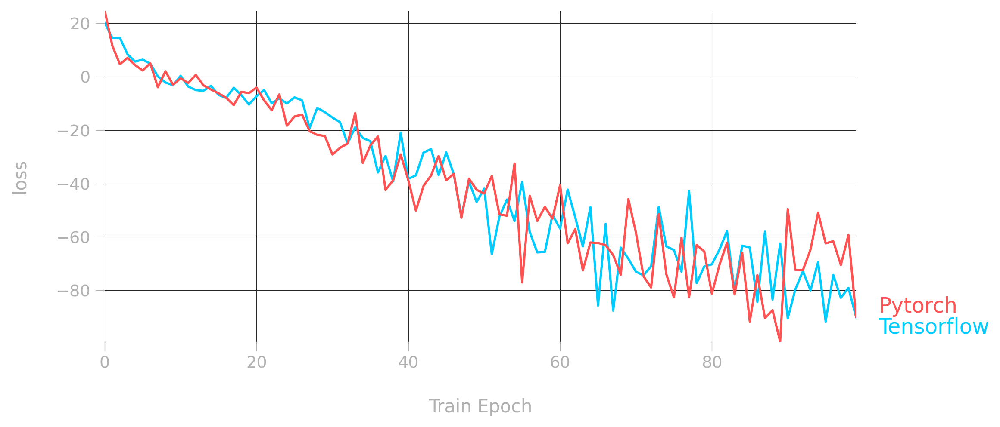

<Figure size 1125x500 with 1 Axes>

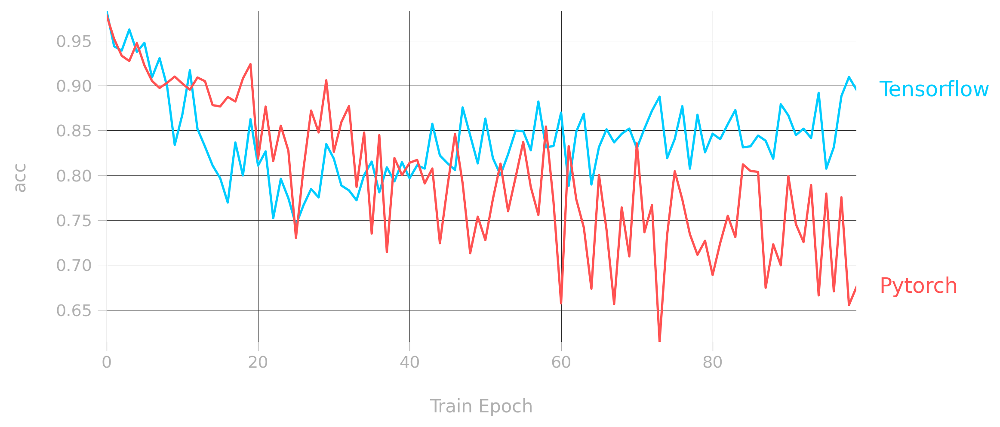

<Figure size 1125x500 with 1 Axes>

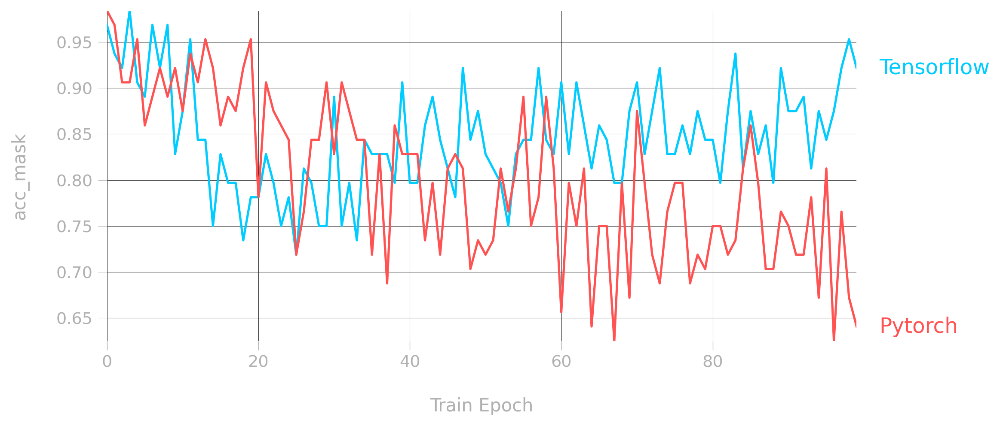

<Figure size 1125x500 with 1 Axes>

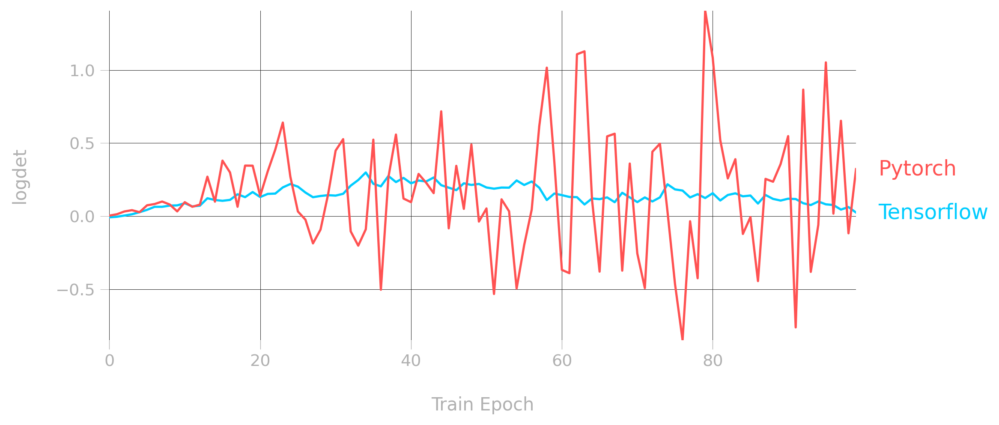

<Figure size 1125x500 with 1 Axes>

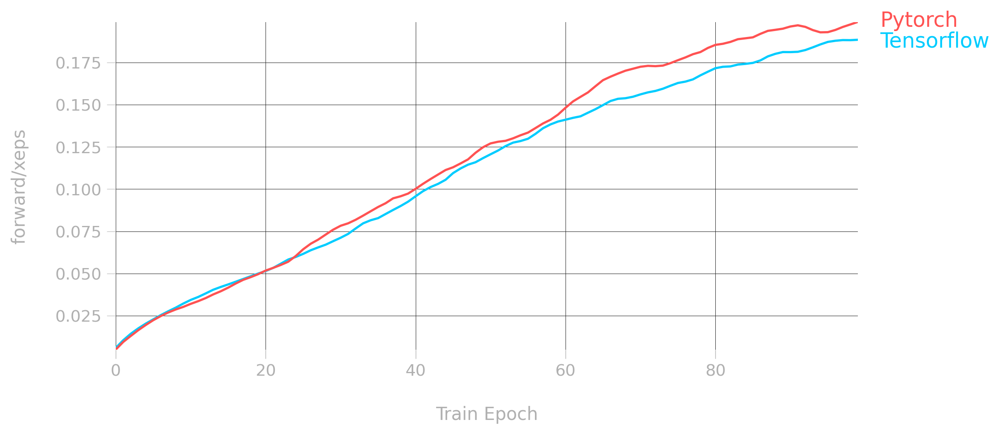

<Figure size 1125x500 with 1 Axes>

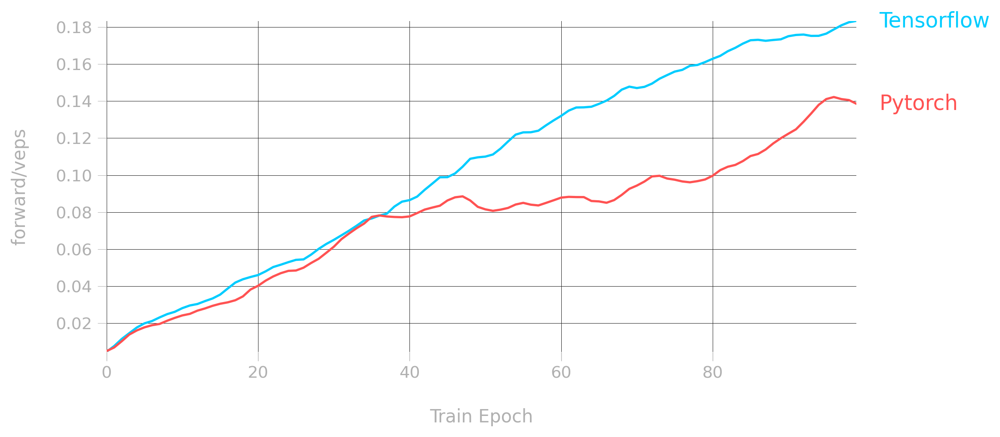

╭──────────────────────────── Traceback (most recent call last) ────────────────────────────╮
│                                                                                           │
│ /var/folders/b0/s0cn4kh53l55xstxzzsd3dn00000gn/T/ipykernel_55411/816923819.py:36 in       │
│ <module>                                                                                  │
│                                                                                           │
│ [Errno 2] No such file or directory:                                                      │
│ '/var/folders/b0/s0cn4kh53l55xstxzzsd3dn00000gn/T/ipykernel_55411/816923819.py'           │
╰───────────────────────────────────────────────────────────────────────────────────────────╯
TypeError: plot_metric() got an unexpected keyword argument 'xlabel'

In [33]:
import src.l2hmc.utils.plot_helpers as hplt

plt.style.use('default')
sns.set_context('notebook')
plt.rcParams.update({
    'figure.dpi': 125,
    'figure.facecolor': '#FFFFFF',
    'axes.facecolor': '#FFFFFF',
    'image.cmap': 'viridis',
})
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])

keys = list(history_tf.history.keys()) + list(history_pt.history.keys())
with plt.style.context(matplotx.styles.dufte):
    for key in keys:
        if key in history_tf.history.keys() and key in history_pt.history.keys():
            ytf = np.array(history_tf.history[key])
            ypt = np.array(history_pt.history[key])
            if len(ytf.shape) == 2:
                ytf = ytf.mean(1)
                ypt = ypt.mean(1)

            fig, ax = plot_both(ytf=ytf, ypt=ypt,
                                figsize=FIGSIZE,
                                xlabel='Train Epoch', ylabel=key)

        else:
            if key in history_tf.history.keys():
                fig, ax = plot_metric(key, history_tf.history[key],
                                      xlabel='Train Epoch',
                                      label='Tensorflow');
            if key in history_pt.history.keys():
                fig, ax = hplt.plot_metric(key, history_pt.history[key],
                                           xlabel='Train Epoch',
                                           label='Pytorch');

        plt.show()

## Plot all `TensorFlow` training metrics:

<xarray.Dataset>
Dimensions: (draw: 100, chain: 64)
Coordinates:
 * draw (draw) int64 0 1 2 3 4 5 6 7 ... 92 93 94 95 96 97 98 99
 * chain (chain) int64 0 1 2 3 4 5 6 7 ... 57 58 59 60 61 62 63
Data variables: (12/15)
 era (draw) int64 0 0 0 0 0 0 0 0 0 0 ... 4 4 4 4 4 4 4 4 4 4
 epoch (draw) int64 0 5 10 15 20 25 30 ... 65 70 75 80 85 90 95
 dt (draw) float64 62.04 0.1767 0.1809 ... 0.3768 0.3805
 loss (draw) float64 20.22 14.49 14.57 ... -82.81 -79.07 -90.0
 acc (chain, draw) float64 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0
 acc_mask (chain, draw) float64 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0
 ... ...
 forward/acc (chain, draw) float64 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0
 forward/sumlogdet (chain, draw) float64 -0.0305 -0.01295 ... 0.01736
 backward/xeps (chain, draw) float64 0.006 0.01055 0.01415 ... nan nan
 backward/veps (chain, draw) float64 0.004 0.006928 0.01076 ... nan nan
 backward/acc (chain, draw) float64 1.0 1.0 0.9877 1.0 ... 1.0 1.0 1.0
 backward/sumlogdet (chain, draw) float64 -0.007724 -0.00178 ... 0.02444 xarray.Dataset Dimensions: draw : 100 chain : 64 Coordinates: (2) draw (draw) int64 0 1 2 3 4 5 6 ... 94 95 96 97 98 99 array([ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17,
 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]) chain (chain) int64 0 1 2 3 4 5 6 ... 58 59 60 61 62 63 array([ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17,
 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]) Data variables: (15) era (draw) int64 0 0 0 0 0 0 0 0 ... 4 4 4 4 4 4 4 4 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,
 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4,
 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]) epoch (draw) int64 0 5 10 15 20 25 ... 75 80 85 90 95 array([ 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80,
 85, 90, 95, 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65,
 70, 75, 80, 85, 90, 95, 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50,
 55, 60, 65, 70, 75, 80, 85, 90, 95, 0, 5, 10, 15, 20, 25, 30, 35,
 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 0, 5, 10, 15, 20,
 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]) dt (draw) float64 62.04 0.1767 ... 0.3768 0.3805 array([62.03594995, 0.17672491, 0.18093896, 0.21079993, 0.17117715,
 0.18748331, 0.31215906, 0.17442322, 0.1821692 , 0.19470572,
 0.2108531 , 0.21905684, 0.22249508, 0.20133495, 0.21571302,
 0.22792792, 0.24664211, 0.20056605, 0.20260096, 0.21497798,
 0.26701808, 0.20461488, 0.23048115, 0.28559375, 0.26458788,
 0.22943091, 0.30995274, 0.20565677, 0.31646609, 0.24407101,
 0.28771281, 0.3090961 , 0.34588194, 0.32702518, 0.29303002,
 0.27172518, 0.27060103, 0.36208892, 0.42039895, 0.38368416,
 0.32534981, 0.28998613, 0.32723188, 0.36564803, 0.44908714,
 0.50496602, 0.45184898, 0.4142499 , 0.33964109, 0.40012074,
 0.38452888, 0.41422939, 0.41908813, 0.48344898, 0.45161223,
 0.45007014, 0.43705297, 0.4017539 , 0.36791086, 0.41993809,
 0.44866776, 0.60102797, 0.46593499, 0.41640782, 0.43169713,
 0.40248609, 0.63507819, 0.39974809, 0.50343084, 0.43620014,
 0.48755717, 0.50092578, 0.65279102, 0.53363514, 0.41729212,
 0.46272421, 0.41740799, 0.38346696, 0.38634968, 0.46737099,
 0.43111777, 0.44672704, 0.39759707, 0.45254397, 0.38195896,
 0.43336582, 0.5311501 , 0.42127419, 0.38539577, 0.45263004,
 0.41858912, 0.40541005, 0.41851187, 0.32372713, 0.36027813,
 0.34525299, 0.42023706, 0.32641387, 0.37679505, 0.38053703]) loss (draw) float64 2

<Figure size 835.409x516.311 with 1 Axes>

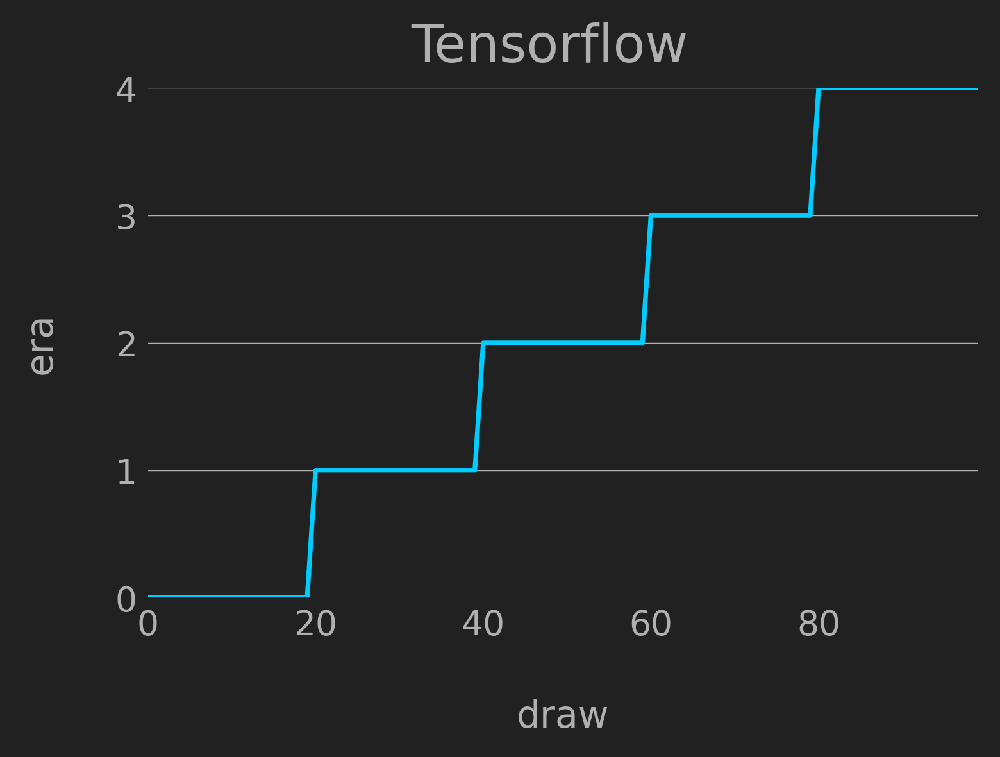

<Figure size 835.409x516.311 with 1 Axes>

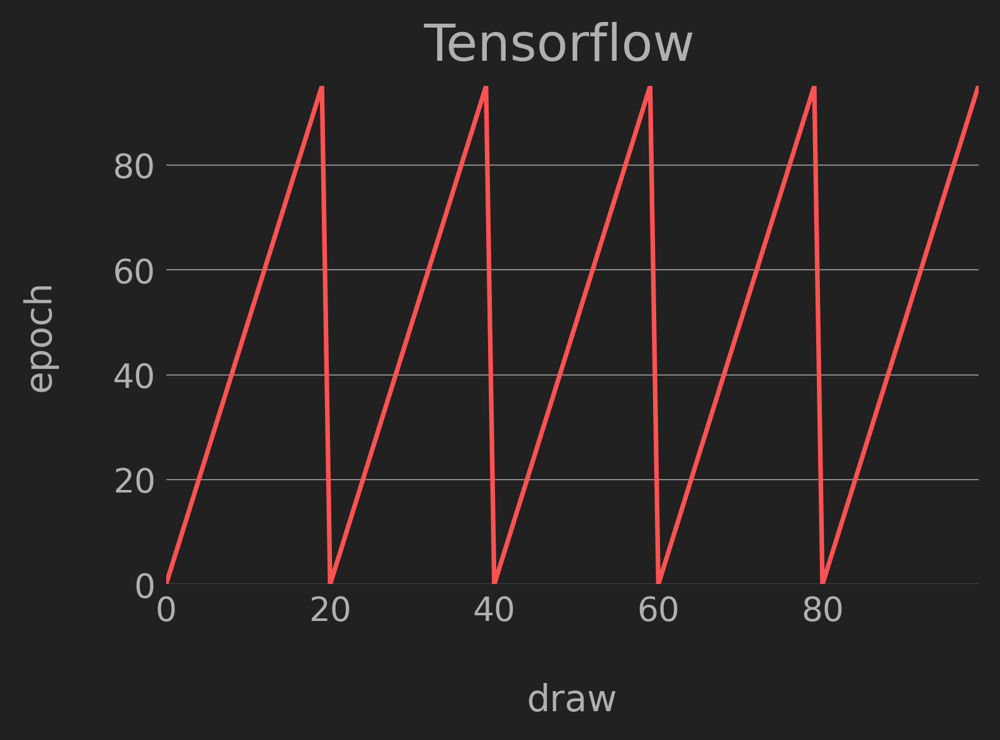

<Figure size 835.409x516.311 with 1 Axes>

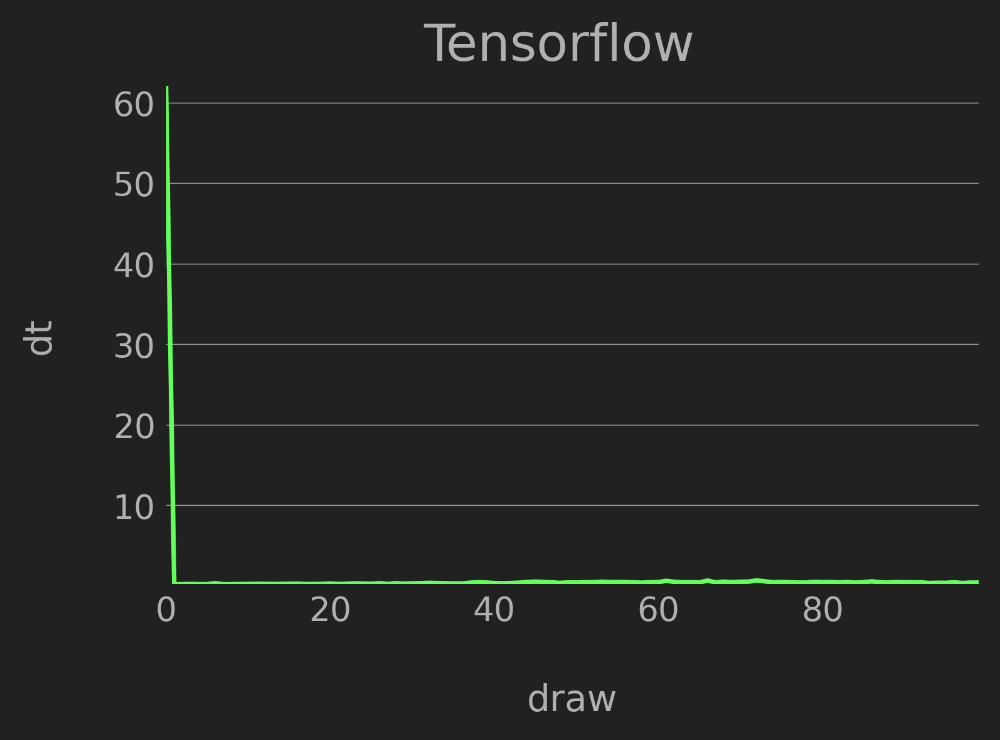

<Figure size 835.409x516.311 with 1 Axes>

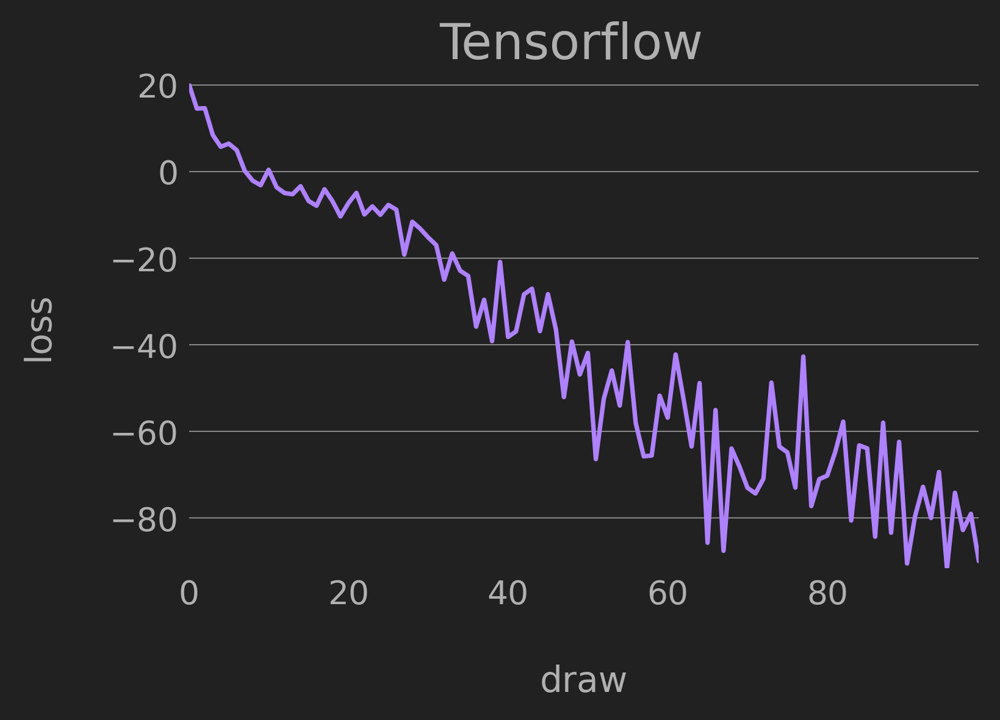

<Figure size 2506.23x774.467 with 4 Axes>

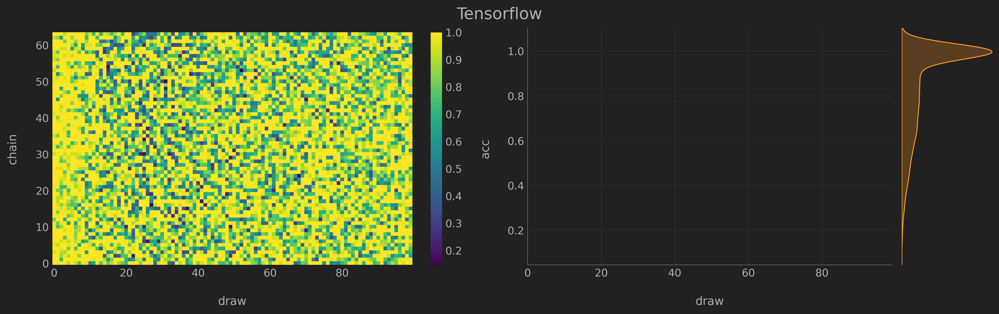

<Figure size 2506.23x774.467 with 4 Axes>

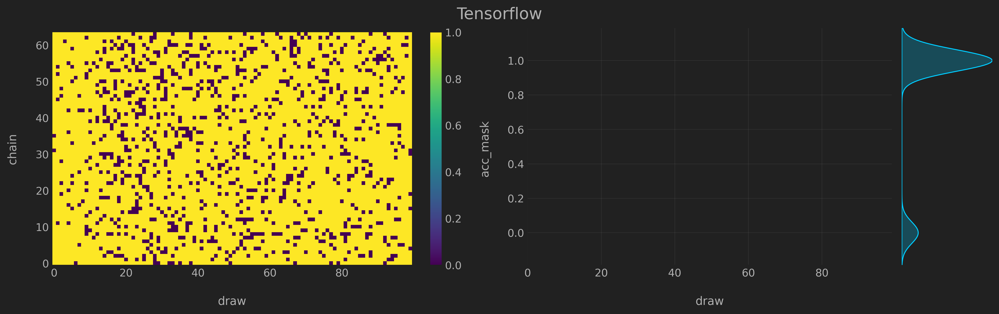

<Figure size 2506.23x774.467 with 4 Axes>

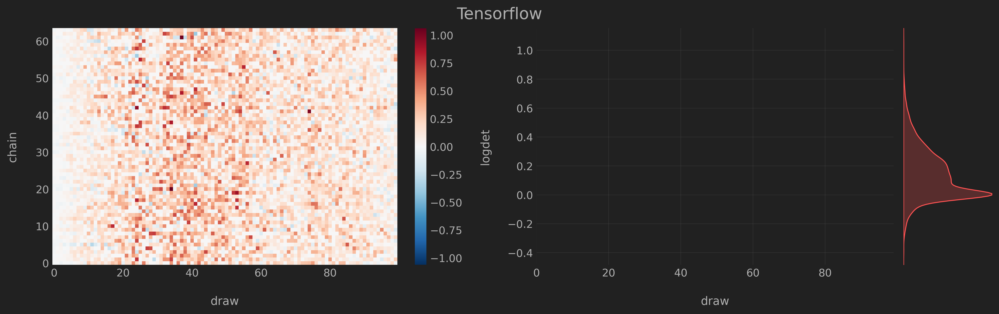

<Figure size 2506.23x774.467 with 4 Axes>

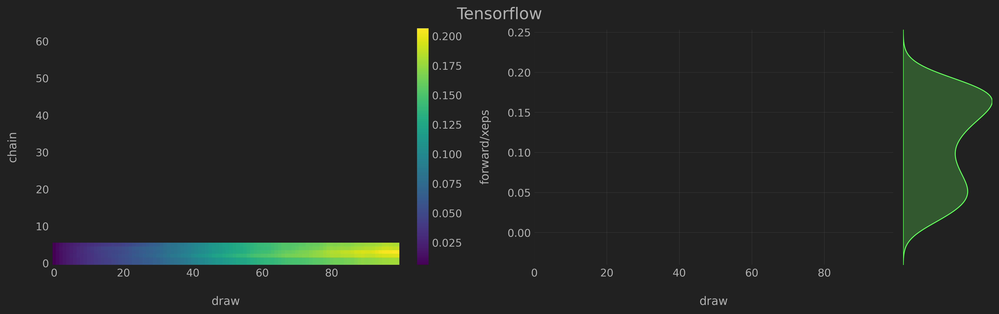

<Figure size 2506.23x774.467 with 4 Axes>

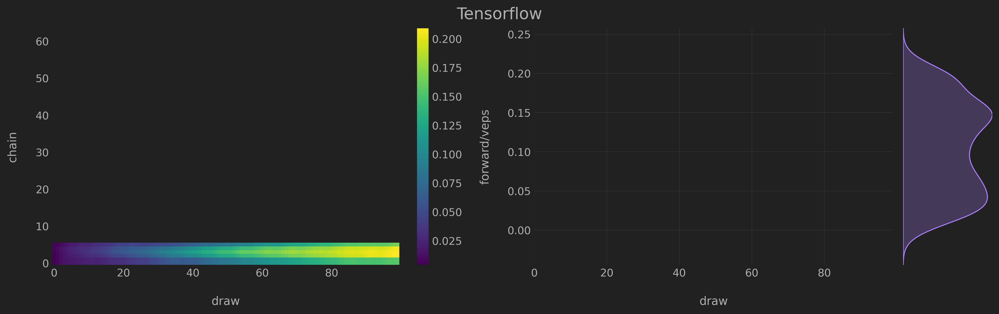

<Figure size 2506.23x774.467 with 4 Axes>

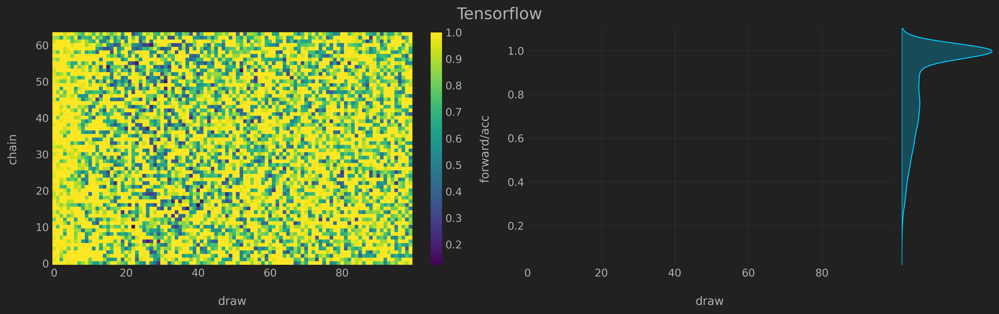

<Figure size 2506.23x774.467 with 4 Axes>

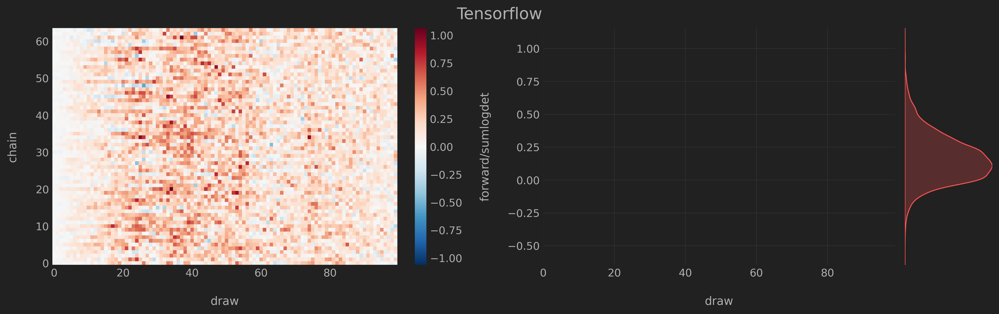

<Figure size 2506.23x774.467 with 4 Axes>

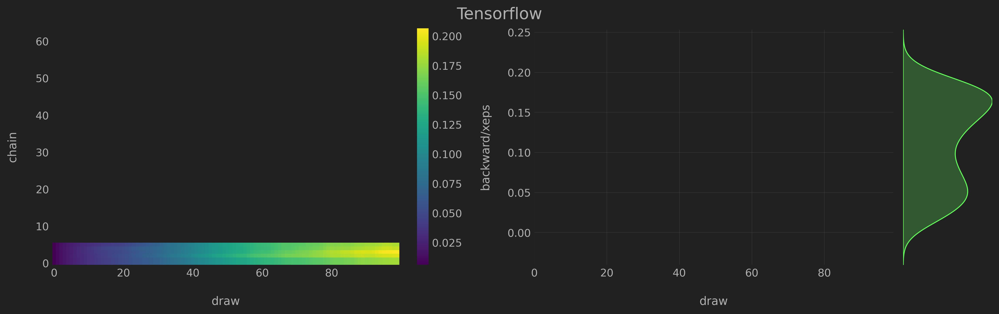

<Figure size 2506.23x774.467 with 4 Axes>

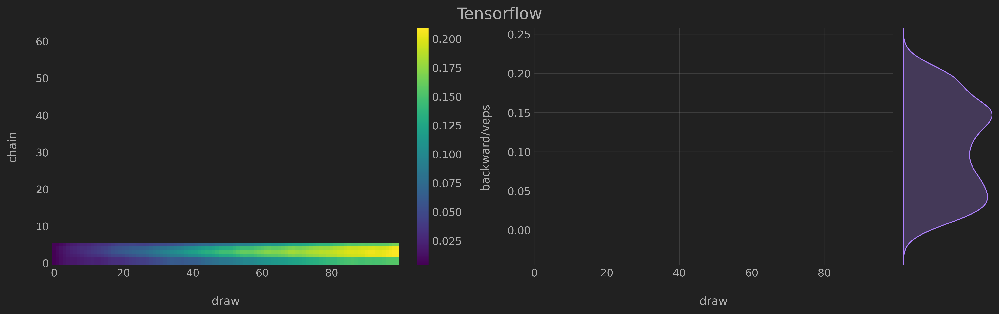

<Figure size 2506.23x774.467 with 4 Axes>

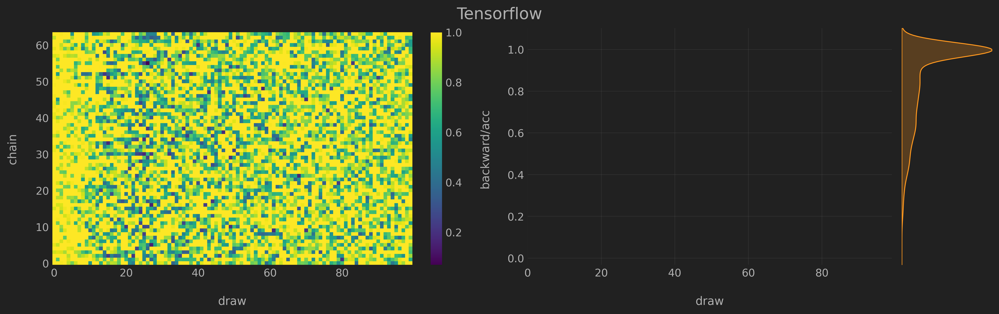

<Figure size 2506.23x774.467 with 4 Axes>

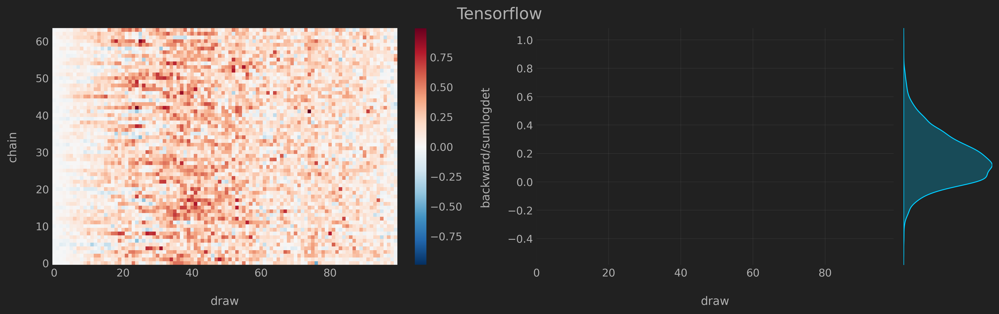

In [35]:
sns.set_context('notebook')
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 175
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'
plt.rcParams['figure.facecolor'] = '#212121'
plt.rcParams['axes.facecolor'] = '#212121'

with plt.style.context(matplotx.styles.dufte):
    history_tf.plot_all(num_chains=10, title="Tensorflow")

## Plot all `PyTorch` training metrics:

/Users/saforem2/projects/l2hmc-qcd/src/l2hmc/utils/history.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, constrained_layout=True)


<xarray.Dataset>
Dimensions: (draw: 100, chain: 64, leapfrog: 6)
Coordinates:
 * draw (draw) int64 0 1 2 3 4 5 6 7 ... 92 93 94 95 96 97 98 99
 * chain (chain) int64 0 1 2 3 4 5 6 7 ... 57 58 59 60 61 62 63
 * leapfrog (leapfrog) int64 0 1 2 3 4 5
Data variables: (12/21)
 era (draw) int64 0 0 0 0 0 0 0 0 0 0 ... 4 4 4 4 4 4 4 4 4 4
 epoch (draw) int64 0 5 10 15 20 25 30 ... 65 70 75 80 85 90 95
 dt (draw) float64 0.1973 0.1714 0.1951 ... 1.359 1.221
 loss (draw) float64 24.78 11.6 4.645 ... -70.52 -59.24 -89.84
 acc (chain, draw) float64 1.0 0.9711 1.0 ... 0.1682 1.0
 acc_mask (chain, draw) float32 1.0 1.0 1.0 0.0 ... 0.0 0.0 1.0
 ... ...
 backward/veps (chain, draw) float64 0.005 0.006935 0.0103 ... nan nan
 backward/energy (chain, leapfrog, draw) float64 116.8 132.0 ... 94.26
 backward/logdet (chain, leapfrog, draw) float64 0.0 0.0 ... 6.69 6.514
 backward/logprob (chain, leapfrog, draw) float64 116.8 132.0 ... 87.74
 backward/acc (chain, draw) float64 0.9841 0.9711 1.0 ... 0.1682 1.0
 backward/sumlogdet (chain, draw) float64 0.02728 0.04696 ... 6.69 6.514 xarray.Dataset Dimensions: draw : 100 chain : 64 leapfrog : 6 Coordinates: (3) draw (draw) int64 0 1 2 3 4 5 6 ... 94 95 96 97 98 99 array([ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17,
 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]) chain (chain) int64 0 1 2 3 4 5 6 ... 58 59 60 61 62 63 array([ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17,
 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]) leapfrog (leapfrog) int64 0 1 2 3 4 5 array([0, 1, 2, 3, 4, 5]) Data variables: (21) era (draw) int64 0 0 0 0 0 0 0 0 ... 4 4 4 4 4 4 4 4 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,
 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4,
 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]) epoch (draw) int64 0 5 10 15 20 25 ... 75 80 85 90 95 array([ 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80,
 85, 90, 95, 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65,
 70, 75, 80, 85, 90, 95, 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50,
 55, 60, 65, 70, 75, 80, 85, 90, 95, 0, 5, 10, 15, 20, 25, 30, 35,
 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 0, 5, 10, 15, 20,
 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]) dt (draw) float64 0.1973 0.1714 ... 1.359 1.221 array([0.19726396, 0.17136621, 0.19506288, 0.18067575, 0.18925071,
 0.2669518 , 0.20387101, 0.19054008, 0.18213677, 0.1788342 ,
 0.22685719, 0.19713473, 0.19427299, 0.19136906, 0.19417906,
 0.21611905, 0.21658397, 0.2246151 , 0.22053218, 0.21301198,
 0.20854783, 0.22191715, 0.22736597, 0.30847716, 0.246701 ,
 0.23048806, 0.23285294, 0.23169589, 0.24403691, 0.25249219,
 0.29062986, 0.2326622 , 0.24346209, 0.29380202, 0.26642084,
 0.27022791, 0.27710795, 0.28100801, 0.30255628, 0.29619908,
 0.37770295, 0.28195667, 0.29781628, 0.31525016, 0.31229615,
 0.34636307, 0.35861301, 0.37341285, 0.35632992, 0.34214306,
 0.40082192, 0.39381933, 0.39531589, 0.40860915, 0.4266901 ,
 0.42485714, 0.42684174, 0.47566009, 0.44317389, 0.45474291,
 0.55233788, 0.45141125, 0.46984076, 0.46448588, 0.48586178,
 0.4900229 , 0.49974108, 0.50639796, 0.53541088, 0.53770399,
 0.55967593, 0.5675559 , 0.56717634, 0.63285971, 0.69062495,
 0.60348797, 0.68657184, 0.67843485, 0.65429306, 0.68754983,
 0.99763012, 0.6711669 , 1.23309493, 0.89626503, 0.97465706,
 0.95432878, 1.01416397, 1.07408786, 1.00014091, 1.04260397,
 1.07515907, 1.

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Overpass
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Overpass


<Figure size 596.721x368.794 with 1 Axes>

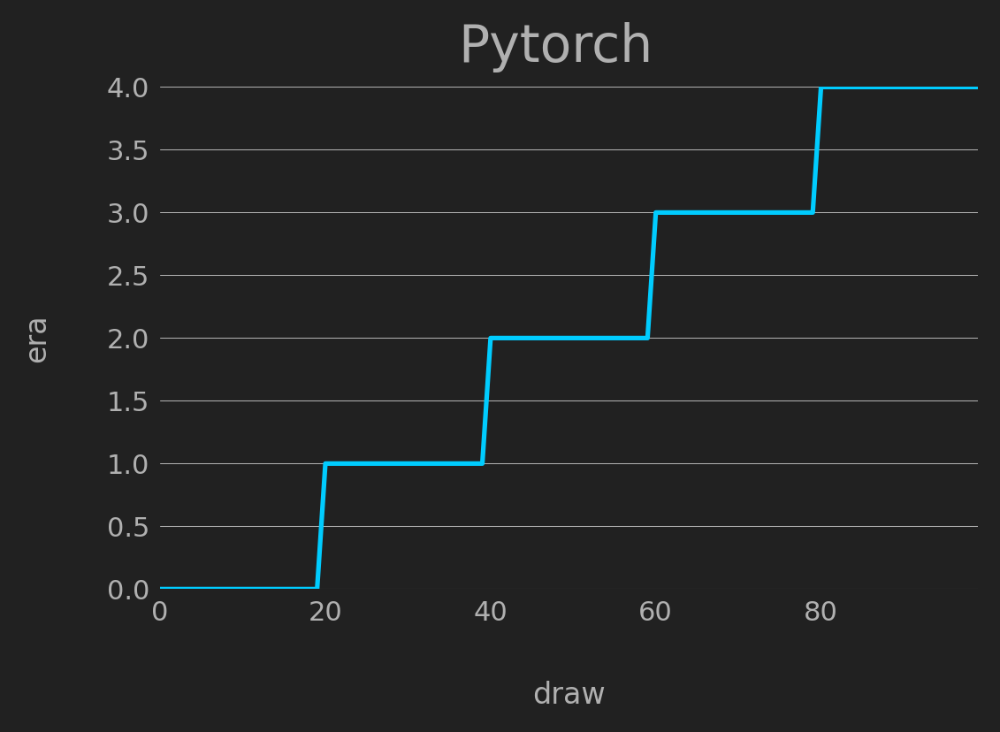

<Figure size 596.721x368.794 with 1 Axes>

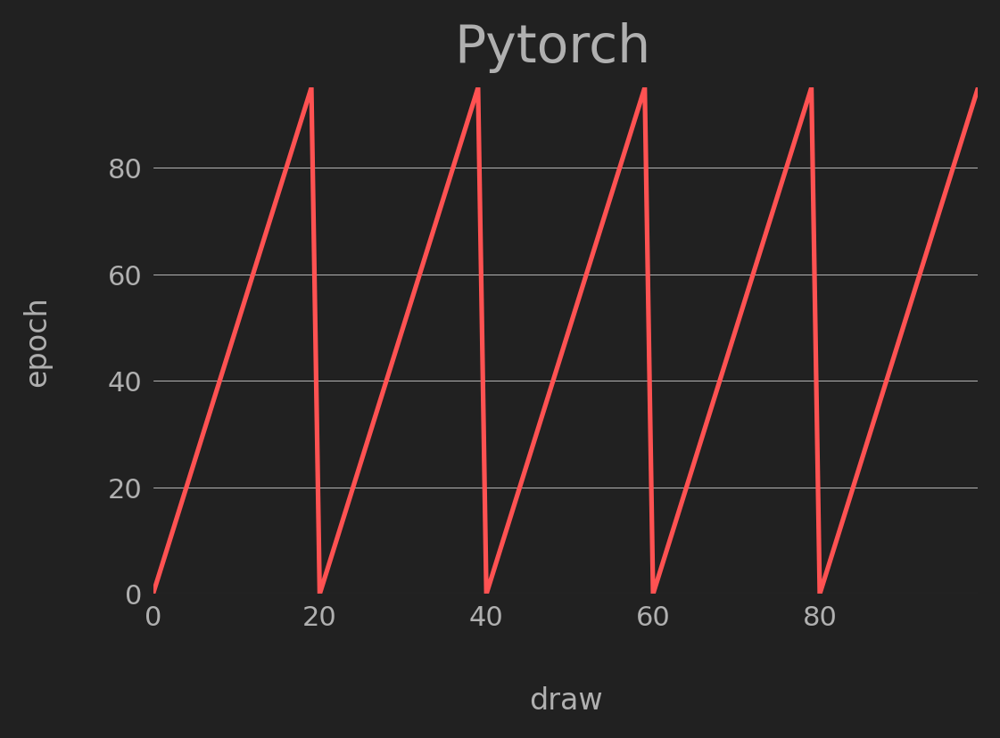

<Figure size 596.721x368.794 with 1 Axes>

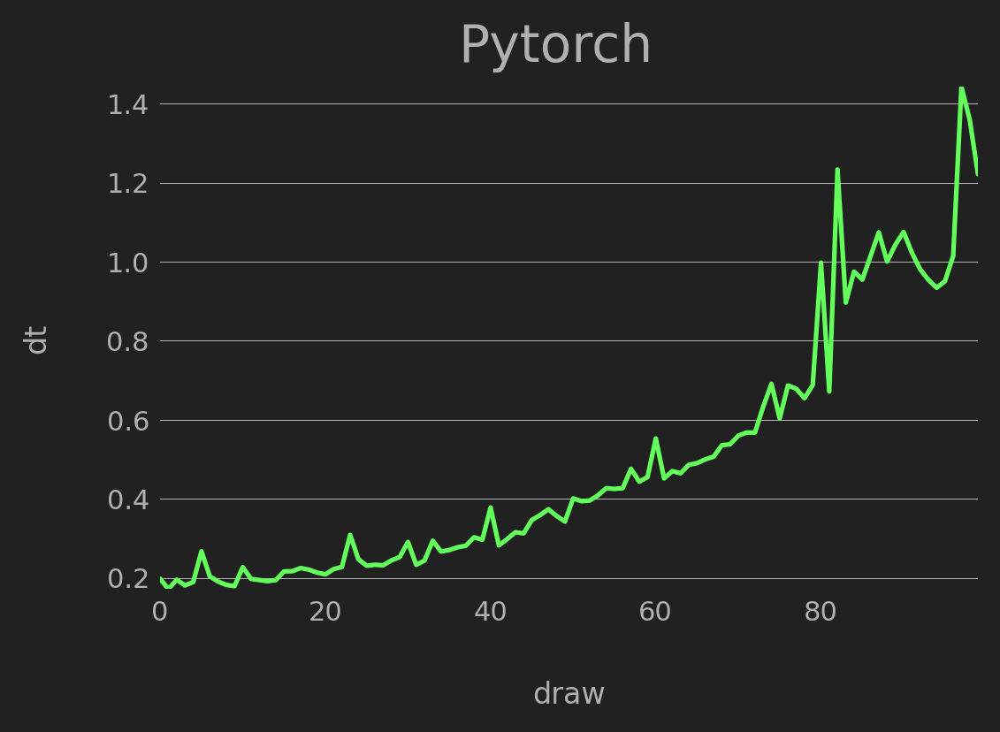

<Figure size 596.721x368.794 with 1 Axes>

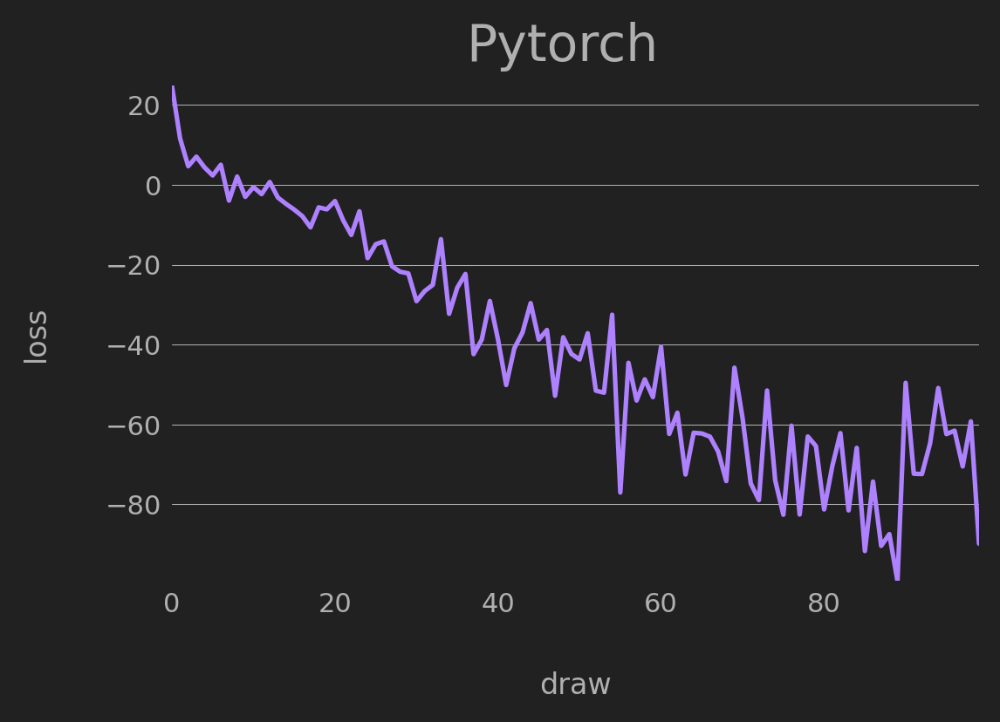

<Figure size 1790.16x553.19 with 4 Axes>

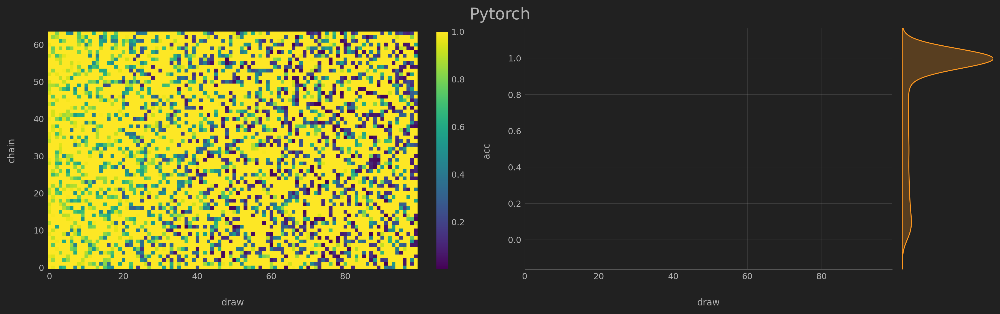

<Figure size 1790.16x553.19 with 4 Axes>

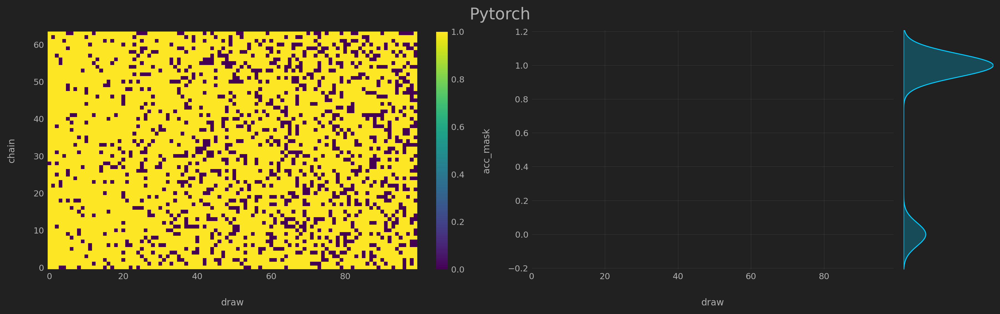

<Figure size 1790.16x553.19 with 4 Axes>

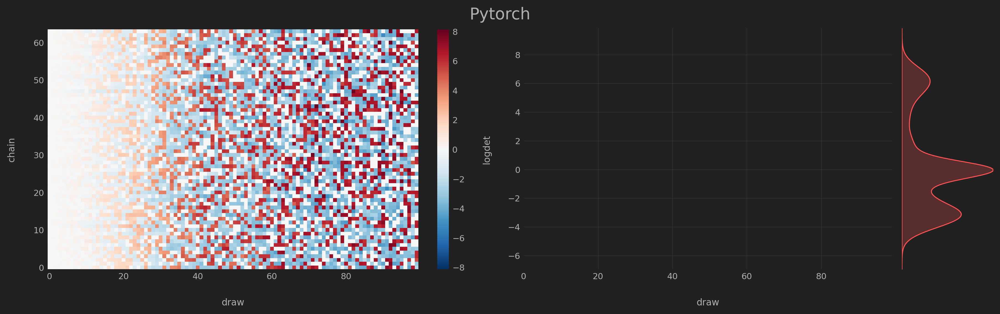

<Figure size 1790.16x553.19 with 4 Axes>

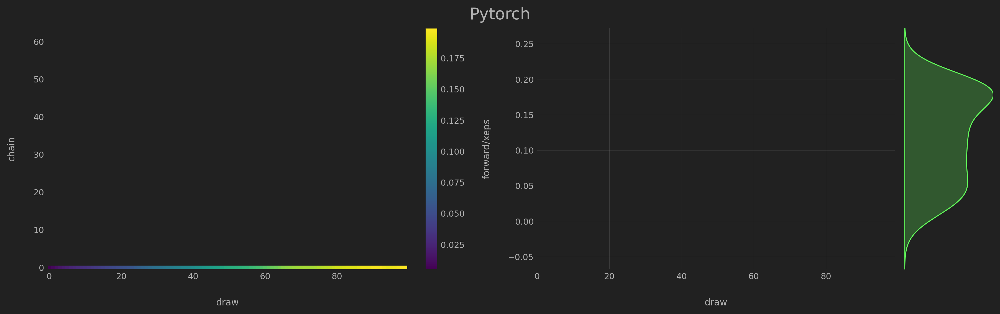

<Figure size 1790.16x553.19 with 4 Axes>

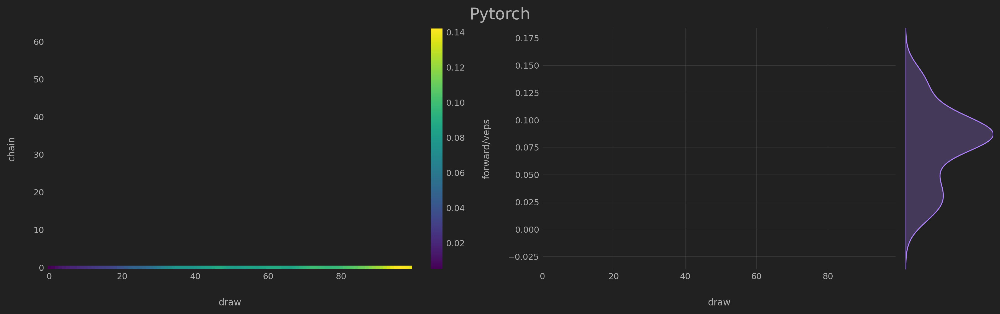

<Figure size 596.721x368.794 with 1 Axes>

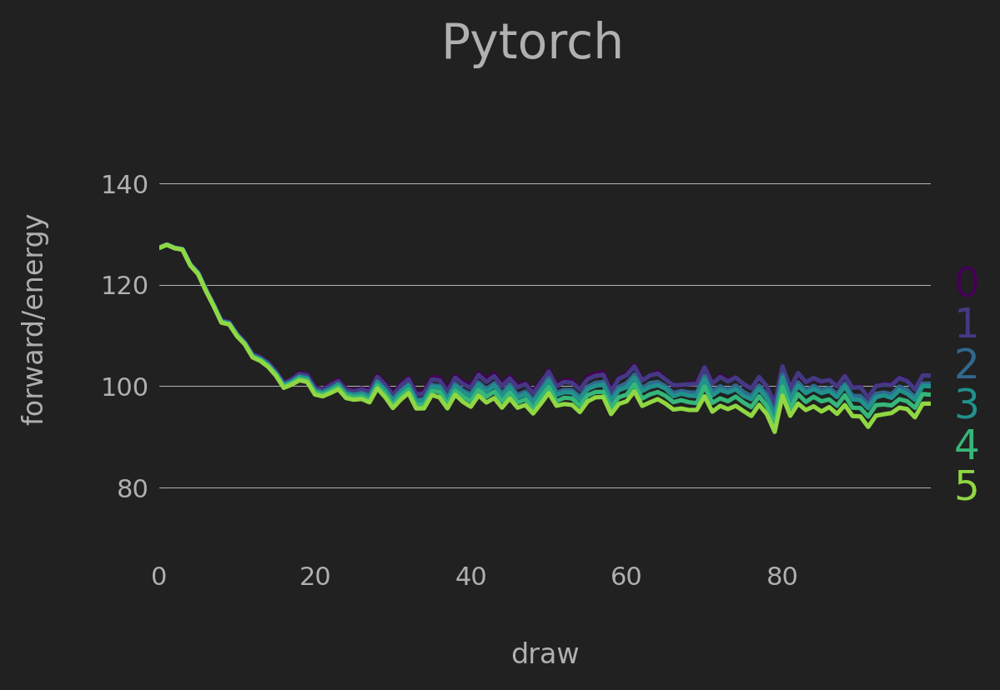

<Figure size 596.721x368.794 with 1 Axes>

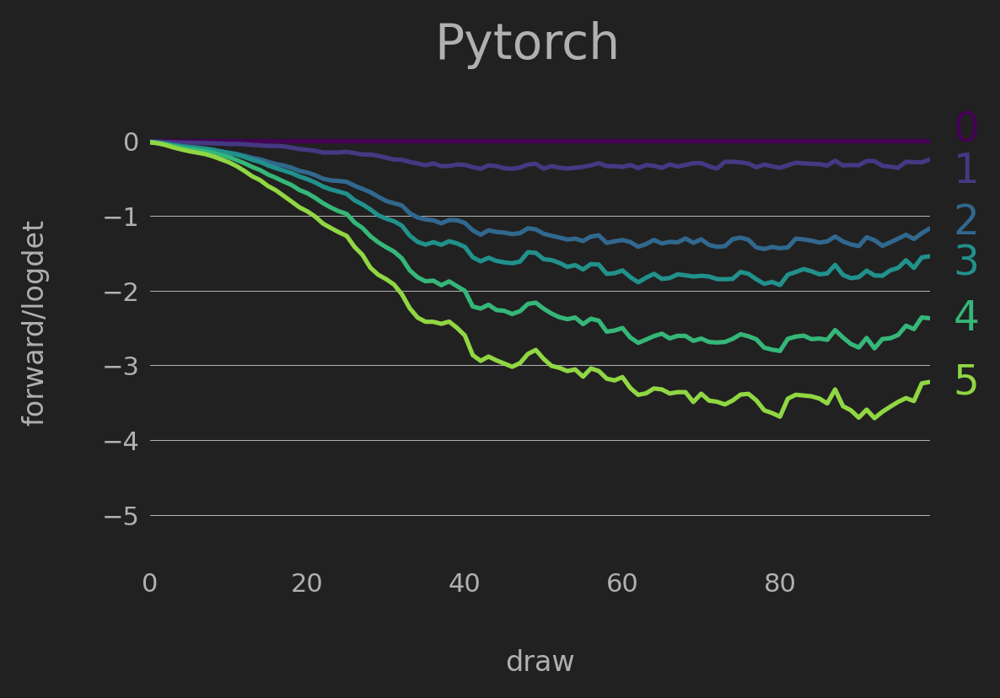

<Figure size 596.721x368.794 with 1 Axes>

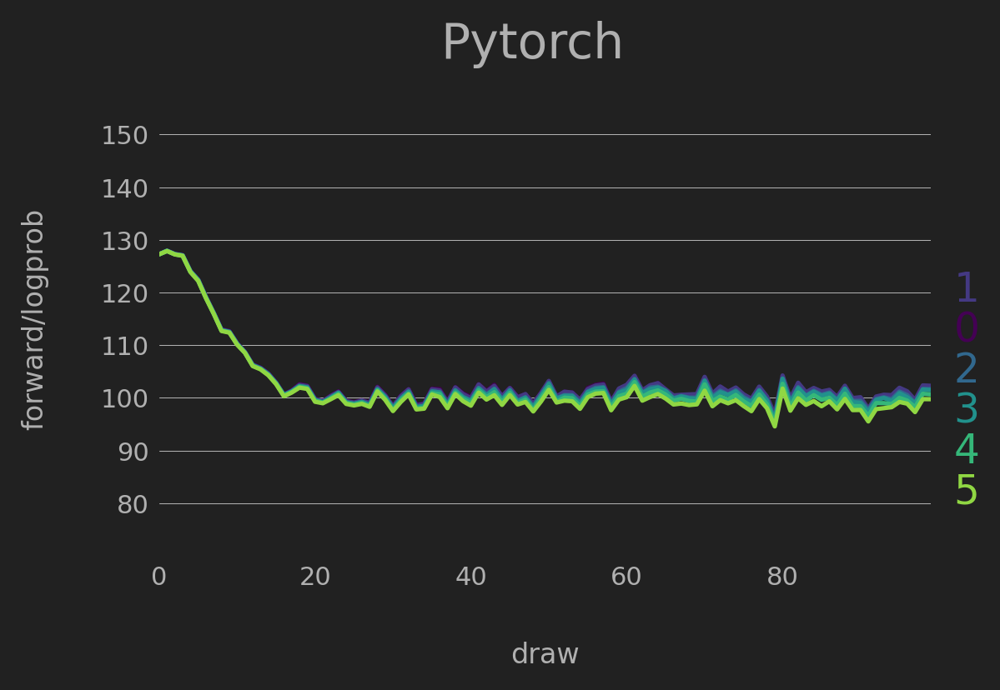

<Figure size 1790.16x553.19 with 4 Axes>

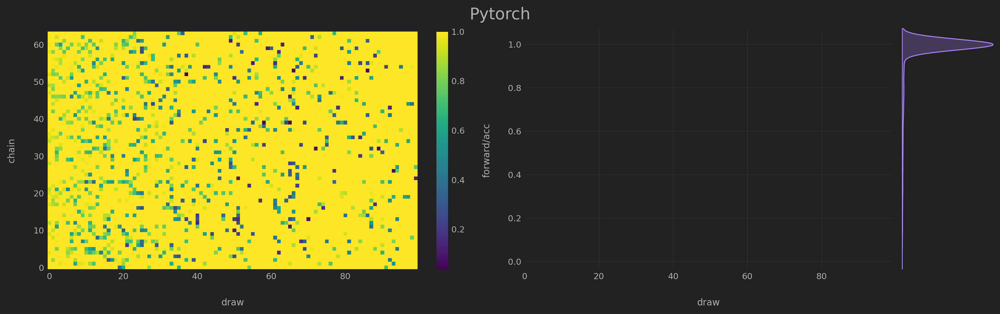

<Figure size 1790.16x553.19 with 4 Axes>

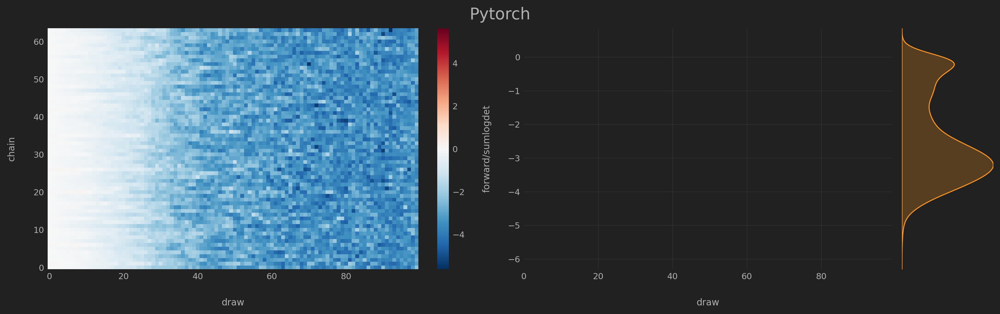

<Figure size 1790.16x553.19 with 4 Axes>

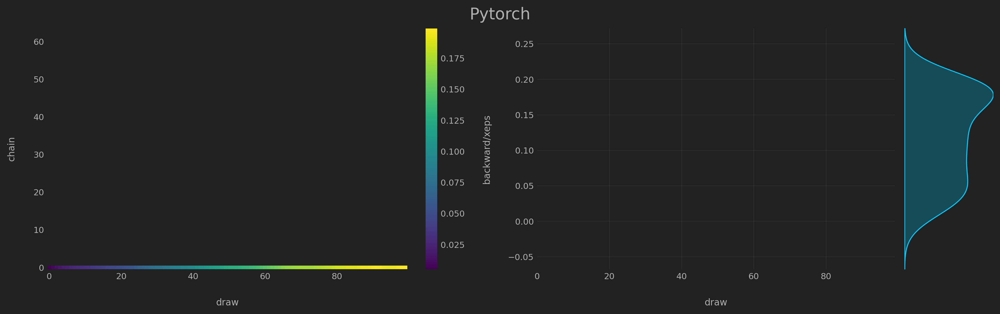

<Figure size 1790.16x553.19 with 4 Axes>

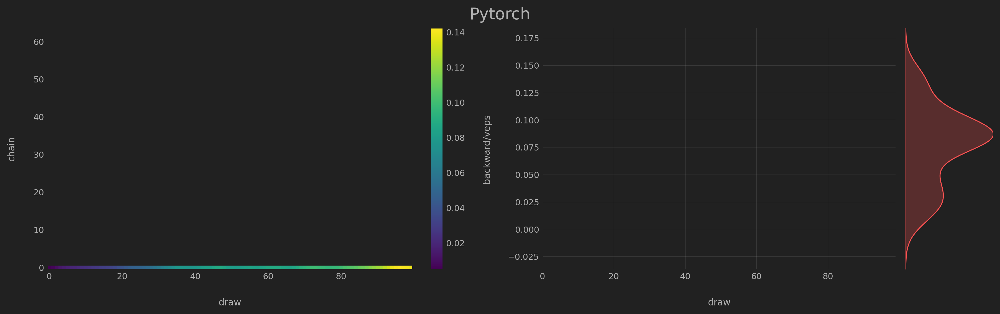

<Figure size 596.721x368.794 with 1 Axes>

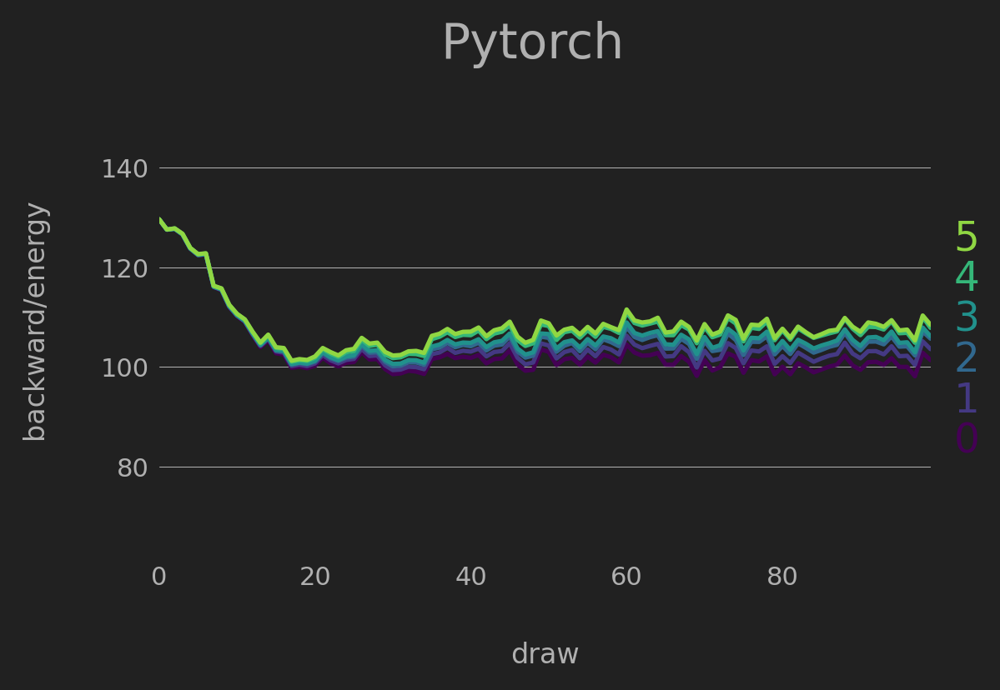

<Figure size 596.721x368.794 with 1 Axes>

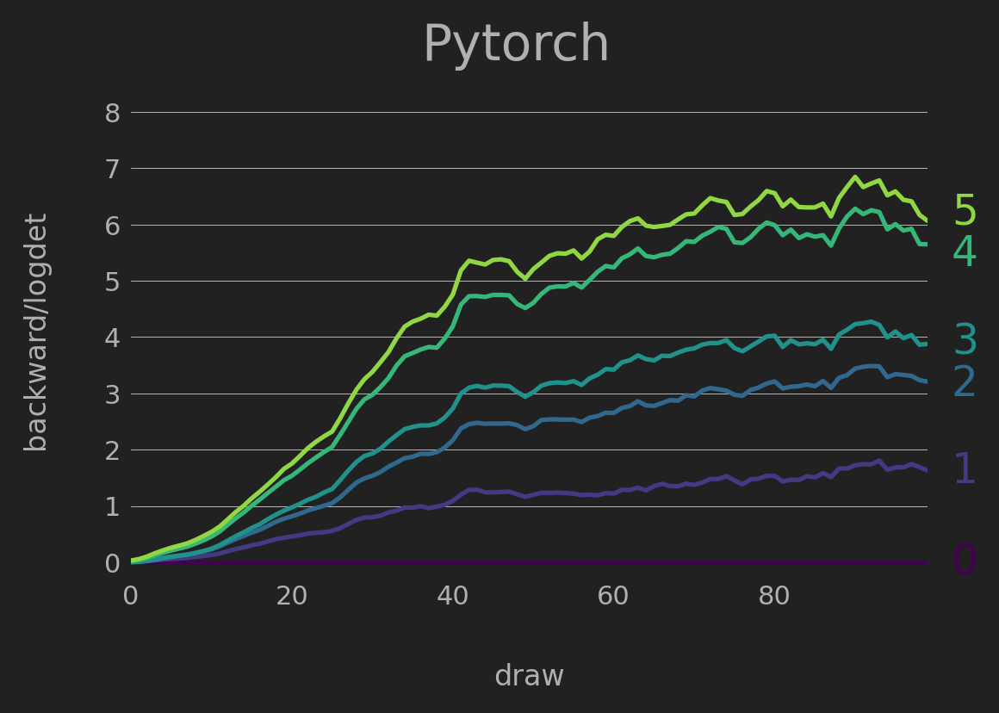

<Figure size 596.721x368.794 with 1 Axes>

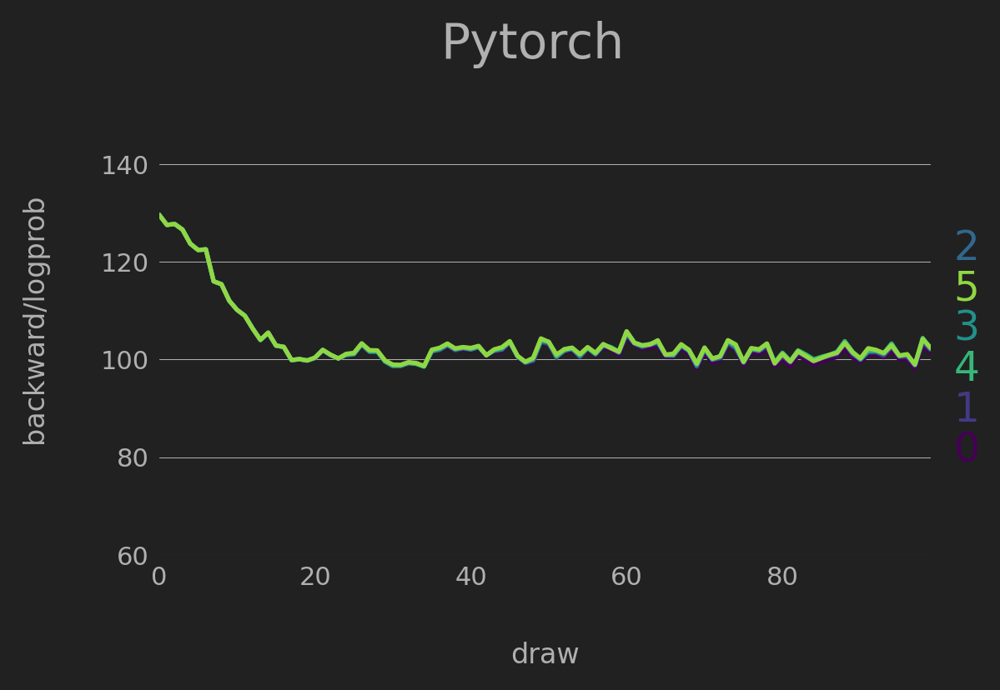

<Figure size 1790.16x553.19 with 4 Axes>

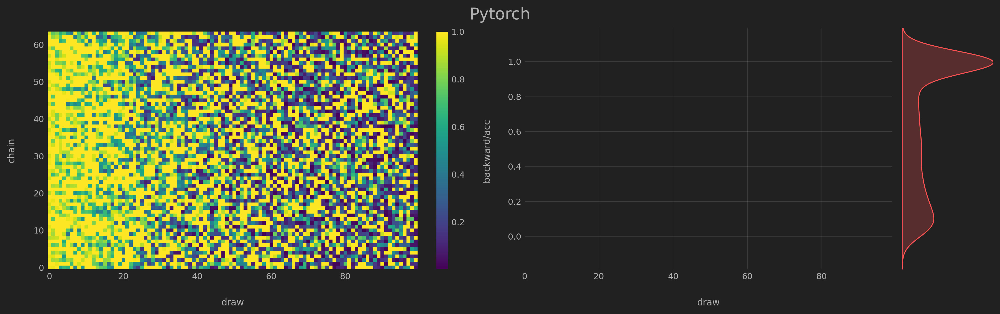

<Figure size 1790.16x553.19 with 4 Axes>

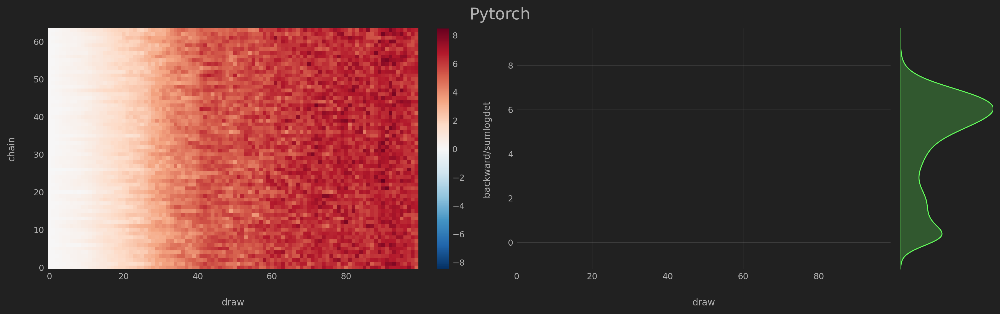

In [36]:
from src.l2hmc.utils.history import History
import src.l2hmc.utils.plot_helpers as hplt

sns.set_context('notebook', font_scale=0.8)
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 125
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'
plt.rcParams['figure.facecolor'] = '#212121'
plt.rcParams['axes.facecolor'] = '#212121'
history_pt_ = History(steps)
history_pt_.history = history_pt.history

with plt.style.context(matplotx.styles.dufte):
    history_pt_.plot_all(num_chains=10, title='Pytorch')

In [ ]:
color = 'C0'
_, subfigs, ax = history_pt_.plot(sldb.T, key=(key := 'backward/sumlogdet'), num_chains=8)
ax0 = subfigs[0].subplots(1, 1)
im = dataset_pt.data_vars['backward/sumlogdet'].plot(ax=ax0)
im.colorbar.set_label(key)
sns.despine(subfigs[0])
ax1 = subfigs[1].subplots(1, 1)
ax2 = subfigs[1].subplots(1, 2)
steps = np.arange(sldb.shape[1])
_ = ax1.plot(steps, sldb.mean(0), lw=2., alpha=1., color='C0');
_ = sns.kdeplot(y=sldb.flatten(), ax=ax2, color=color, shade=True)
_ = ax2.set_xticks([])
_ = ax2.set_xticklabels([])
for idx in range(10):
    _ = ax1.plot(steps, sldb[idx, :], lw=1., alpha=0.7, color='C0');

In [ ]:
len(subfigs)

In [ ]:
history_pt.

In [ ]:
%debug

In [ ]:
from src.l2hmc.utils.plot_helpers import (
    plot_dataset, plot_metric,
    plot_array, plot_chains, plot_leapfrogs, plot_scalar
)

sns.set_context('notebook')
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 175
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'
plt.rcParams['figure.facecolor'] = '#212121'
plt.rcParams['axes.facecolor'] = '#212121'

xlabel = 'Train Epoch'
label = 'Pytorch'
with plt.style.context(matplotx.styles.dufte):
    for key, val in history_pt.history.items():
        ylabel = key
        arr = np.array(val)
        print(f'{key}.shape = {arr.shape}')
        arr_tf = None
        label = None
        if key in history_tf.history:
            label = 'Pytorch'
            label_tf = 'Tensorflow'
            arr_tf = np.array(history_tf.history[key])
            
        if len(arr.shape) > 1:
            if len(arr.shape) == 3:
                fig, ax = plot_leapfrogs(arr, xlabel=xlabel, ylabel=ylabel)
            elif len(arr.shape) == 2:
                fig, ax = plot_chains(arr, num_chains=10,
                                      xlabel=xlabel, ylabel=ylabel, label=label)
                if arr_tf is not None:
                    fig, ax = plot_chains(arr_tf, num_chains=10,
                                          fig_axes=(fig, ax),
                                          label=label_tf, color='C1')
        else:
            fig, ax = plot_scalar(arr, xlabel=xlabel, ylabel=ylabel, label=label)
            fig, ax = plot_scalar(arr_tf, fig_axes=(fig, ax), label=label_tf, color='C1')

In [ ]:
from src.l2hmc.utils.plot_helpers import (
    plot_dataset, plot_metric,
    plot_array, plot_chains, plot_leapfrogs, plot_scalar
)

sns.set_context('notebook')
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 175
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'
plt.rcParams['figure.facecolor'] = '#212121'
plt.rcParams['axes.facecolor'] = '#212121'

xlabel = 'Train Epoch'
label = 'Tensorflow'
with plt.style.context(matplotx.styles.dufte):
    for key, val in history_tf.history.items():
        ylabel = key
        arr = np.array(val)
        print(f'{key}.shape = {arr.shape}')
        if len(arr.shape) > 1:
            if len(arr.shape) == 3:
                fig, ax = plot_leapfrogs(arr, xlabel=xlabel, ylabel=ylabel)
            if len(arr.shape) == 2:
                fig, ax = plot_chains(arr, num_chains=10,
                                      xlabel=xlabel, ylabel=ylabel, label=label)
        else:
            fig, ax = plot_scalar(arr, xlabel=xlabel, ylabel=ylabel, label=label)
        #print(f'{key}.shape = {arr.shape}')
        #fig, ax = plot_array(arr, key=key, num_chains=10)
        #_ = ax.set_title('Tensorflow')

In [ ]:
 
#plt.rcParams['figure.dpi'] = 150
plt.style.use('default')
sns.set_context('notebook')
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')
with plt.style.context(matplotx.styles.dufte):
    plot_dataset(dataset_tf)

In [ ]:
import arviz as az

az.plot_density(dataset_pt)

In [ ]:
import xarray as xr

plt.style.use('default')
sns.set_context('notebook')
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')
with plt.style.context(matplotx.styles.dufte):
    for key, val in dataset_pt.data_vars.items():
            fig, ax = plt.subplots()
            #print(f'{key}.shape: {val.shape}')
            if len(val.shape) > 1:
                _ = val[:8].plot(ax=ax, robust=True);
            else:
                _ = val.plot(ax=ax);
            #xr.DataArray.plot(

In [ ]:
val.plot(ax=ax)

In [ ]:
#plt.rcParams['axes.linewidth'] = 0
sns.set_context('notebook')
plt.style.use('default')
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')
with plt.style.context(matplotx.styles.dufte):
    plot_dataset(dataset_pt, num_chains=10)

In [ ]:
%debug

In [ ]:
history_tf_ = stack_history(output_tf['history'].history)
history_pt_ = stack_history(output_pt['history'].history)

history_tf_.keys()
history_pt_.keys()

In [ ]:
def plot_metric(key, val, xlabel=None, label=None, **kwargs):
    fig, ax = plt.subplots(figsize=FIGSIZE)
    arr = np.array(val)
    if len(arr.shape) == 3:
        nlf = arr.shape[1]
        lfarr = np.arange(nlf)
        cmap = plt.get_cmap('viridis')
        colors = {lf: cmap(lf / nlf) for lf in lfarr}
        arr = np.transpose(arr, (1, 0, 2))
        for i, ylf in enumerate(arr):
            y = arr.mean(1)
            x = np.arange(len(y))
            _ = ax.plot(x, y, color=colors[i], **kwargs);
    else:
        if len(arr.shape) == 2:
            y = arr.mean(1)
        else:
            y = arr
            
        x = np.arange(len(y))
        _ = ax.plot(x, y, label=label, **kwargs);
        
    matplotx.line_labels(ax=ax)
    _ = ax.set_ylabel(key);
    if xlabel is not None:
        _ = ax.set_xlabel(xlabel);
        
    return fig, ax

In [ ]:
#sns.set_palette(['#228BE6', '#FF5252', '#40C057', '#E64980',
# '#14AABF', '#BE4BDB'])
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['figure.dpi'] = 175

keys = list(history_tf_.keys()) + list(history_pt_.keys())
for key in keys:
    if key in history_tf_.keys() and key in history_pt_.keys():
        ytf = history_tf_[key]
        ypt = history_pt_[key]
        if len(ytf.shape) == 2:
            ytf = ytf.mean(1)
            ypt = ypt.mean(1)

        fig, ax = plot_both(ytf=ytf, ypt=ypt,
                            figsize=FIGSIZE,
                            xlabel='Train Epoch', ylabel=key)
        
    else:
        if key in history_tf_.keys():
            fig, ax = plot_metric(key, history_tf_[key],
                                  xlabel='Train Epoch',
                                  label='Tensorflow');
        if key in history_pt_.keys():
            fig, ax = plot_metric(key, history_pt_[key],
                                  xlabel='Train Epoch',
                                  label='Pytorch');
    plt.show()

In [ ]:
history_pt = output_pt['history']
history_tf = output_tf['history']

In [ ]:
from src.l2hmc.utils.history
history_pt_copy = 

In [ ]:
history_pt.g

In [ ]:
 
        fig, ax = plt.subplots(figsize=FIGSIZE, constrained_layout=True)
        if key in history_tf_.keys():
            ytf = history_tf_[key]
            if len(ytf.shape) == 2:
                ytf = ytf.mean(1)
            _ = ax.plot(np.arange(ytf.shape[0]), ytf, label='Tensorflow');
            
        if key in history_pt_.keys():
            ypt = history_pt_[key]
            if len(ypt.shape) == 2:
                ypt = ypt.mean(1)
            _ = ax.plot(np.arange(ypt.shape[0]), ypt, label='Pytorch');

        matplotx.line_labels(ax=ax)
        _ = ax.set_ylabel(key);
        _ = ax.set_xlabel('Train Epoch');

In [ ]:
keys = [str(i) for i in range(len(history_tf['forward']))]
history_tf_ = dict(zip(keys, history_tf['forward']))

history_tf.keys()
history_tf_.keys()
history_tf['forward'][0].keys()

In [ ]:
history_tf_fwd = {}
for key in history_tf['forward'][0].keys():
    history_tf_fwd[key] = [x.get(key) for x in history_tf['forward']]

In [ ]:
htf_fwd = tf.stack(history_tf_fwd['energy'])

In [ ]:
history_pt_fwd = {}
for key in history_pt['forward'][0].keys():
    history_pt_fwd[key] = [x.get(key) for x in history_pt['forward']]

In [ ]:
history_pt_fwd_ = {}
for key, val in history_pt_fwd.items():
    try:
        history_pt_fwd_[key] = stack(val)
    except:
        history_pt_fwd_[key] = np.zeros_like(val)
        
history_tf_fwd_ = {}
for key, val in history_tf_fwd.items():
    if key == 'sumlogdet':
        continue
    try:
        history_tf_fwd_[key] = stack(val)
    except:
        history_tf_fwd_[key] = []

In [ ]:
from pathlib import Path
import matplotx
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context('notebook')
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 150
plt.rcParams['axes.grid'] = False
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'


colors = plt.get_cmap('viridis')
lfcolors = {
    i: colors(i) for i in range(history_pt_fwd_['energy'].shape[1])
}

nrows = 5
efwd_pt = history_pt_fwd_['energy']  # shape: (ntrain, nlf, batch_size)
ntrain, nlf, batch_size = history_pt_fwd_['energy'].shape
steps = ntrain // nrows
idxs = np.arange(0, ntrain, steps)
idxs = np.arange(50, ntrain, ntrain // nrows)
fig, axes = plt.subplots(figsize=(7, 8), nrows=nrows+1, sharex=True)
with plt.style.context(matplotx.styles.dufte):
    for idx in range(nrows):
        ax = axes.flatten()[idx]
        y = efwd_pt[idxs[idx]]
        for lf in range(nlf):
            color = colors(lf / nlf)
            #label = f'{int(steps)}% trained' #if lf == nlf - 1 else None
            label = f'lf: {lf}' if idx == 0 else None
            _ = sns.kdeplot(y[lf], color=color, label=label, ax=ax);
        _ = ax.grid(True, color='#303030', axis='x')
        _ = ax.grid(False, axis='y')
        _ = matplotx.line_labels(ax=ax);
        _ = ax.set_ylabel('');
        _ = ax.set_yticklabels([]);
        _ = ax.set_xticklabels([]);
        xy = (0.9, 0.8)
        _ = ax.text(*xy, f'{int(100*idxs[idx]/ntrain)}%', transform=ax.transAxes, color='#666666', fontsize='small')

ax = axes.flatten()[-1]
y = efwd_pt[-1]        
for lf in range(nlf):
    color = colors(lf / nlf)
    #label = f'{int(steps)}% trained' #if lf == nlf - 1 else None
    label = f'lf: {lf}' if idx == 0 else None
    _ = sns.kdeplot(y[lf], color=color, label=label, ax=ax);

_ = ax.text(*xy, f'100%', transform=ax.transAxes, color='#666666', fontsize='small')
_ = ax.set_ylabel('');
_ = ax.set_yticklabels([]);
_ = ax.grid(True, color='#303030', axis='x')
_ = ax.grid(False, axis='y')
outdir = Path('.').joinpath('plots')
outfile = outdir.joinpath(f'train_history-{time.time()}.png')
print(f'Saving figure to: {outfile.as_posix()}')
_ = plt.savefig(outfile.as_posix(), transparent=True, dpi=750)

In [ ]:
import arviz as az
import xarray as xr

dataset_fwd_pt = {}
for key, val in history_pt_fwd_.items():
    #fig, ax = plt.subplots()
    darr = xr.DataArray(val.tranpose()
    dataset_fwd_pt[key] = darr
    #print(f'{key}: {val.shape}')
    
dataset_fwd_pt = xr.Dataset(dataset_fwd_pt)

### Save the plot from the previous run

In [ ]:
losses_arr_tf = np.stack(list(losses_tf.values())).flatten()

with plt.style.context(matplotx.styles.dufte):
    fig, ax = plt.subplots(figsize=(8, 6))
    _ = ax.plot(np.arange(len(losses_arr_tf)), losses_arr_tf, label='Tensorflow');
    _ = ax.plot(np.arange(len(losses_arr)), losses_arr, label='Pytorch');
    _ = ax.set_xlabel(r'Train Epoch')
    _ = ax.set_ylabel('loss')
    matplotx.line_labels()  # line labels to the right